# PASCAL VOC Data Preprocessing

A practical data analysis is performed for the VOC dataset, with the specific steps as follows:
-	Data Inspection: Check for data missingness, duplicates, and uniqueness.
-	Data Cleaning: Clean the data based on the results of data inspection, handle missing values and duplicates.
-	Exploratory Data Analysis: Explore potential patterns in the dataset based on experimental and model requirements and business scenarios.
-	Data Preprocessing: Perform feature engineering and data normalization and standardization.

Data used:
VOC2007 training/validation (trainval) and VOC2012 trainval are used as the training/validation set. VOC2007 test set is used for testing.

Basic Approach:
-	Read XML annotation files contained in data_07, data_12, and test_07, and convert them into data frames.
-	Read the txt files to obtain the corresponding image filenames for the training/validation and test sets. Group them with the df.filename to obtain the data frames for the training/validation and test sets.
-	Perform data analysis and data preprocessing on the dataframes of the training/validation set (df_trainval) and test set (df_test).
After preprocessing, output the data in the YOLO format as a txt file for model training and validation.

Current Progress:
-	Performed preliminary data analysis.
-	Extracted the top 100 non-difficult objects based on image quality assessment scores for each of the 20 classes, resulting in 2000 images and 6846 bounding boxes.
-	It may be advisable to consider randomly selecting images from the 07_test as the test set, based on the quantity of the training/validation set.
-	If following the above data selection, the corresponding images can be obtained as the training set based on the filenames in df_selected, which will require data augmentation.
-	If data augmentation is not desired, data can be selected based on certain features (such as directly selecting 5000 images based on scores), but this may require removing part of the data to prevent data imbalance.

Additional Datasets:
https://github.com/zstar1003/Dataset


In [ ]:
import time
import xml.etree.ElementTree as ET
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
import pyiqa
# from skimage import io, img_as_float
# from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity

## 0. Functions & Methods

In [ ]:
# Input filename of image and show the image
# Since images in test set are not included in the ‘JPEGImages’ file, test_control is used to control the path of image

def img_show(img_name, test_control = False):
    if test_control == True:
        image_path = os.path.join('test_07\JPEGImages',img_name)
    else:
        image_path = os.path.join('JPEGImages',img_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.axis('off')
    plt.imshow(image)

In [ ]:
# Input dataframe and filename of image and show the bounding boxes of the image
def vis_image(df, image_name):
    df_slice = df[df.filename == image_name].copy()
    # print(df_slice)
    # Set image width and height
    width = int(df_slice['width'].iloc[0])
    height = int(df_slice['height'].iloc[0])

    df_slice[['xmin', 'ymin', 'xmax', 'ymax']] = df_slice[['xmin', 'ymin', 'xmax', 'ymax']].astype(int)

    image_path = os.path.join('JPEGImages', image_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Define colour map and select a bright and high-contrast colour for each of the classes
    color_map = {}
    for class_name in df_slice['class'].unique():
        color_map[class_name] = (random.randint(100, 255), random.randint(100, 255), random.randint(100, 255))

    # Draw bounding boxes
    for _, row in df_slice.iterrows():
        # Obtain the class name and coordinates
        class_name = row['class']
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        color = color_map[class_name]
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
        cv2.putText(image, class_name, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

### Data Loading

In [ ]:
# Read XML files in annotation
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    image_data = {
        'filename': root.find('filename').text,
        'width': int(root.find('size/width').text),
        'height': int(root.find('size/height').text),
        'depth': int(root.find('size/depth').text),
        'objects': []
    }
    for obj in root.findall('object'):
        obj_data = {
            'class': obj.find('name').text,
            'xmin': float(obj.find('bndbox/xmin').text),
            'ymin': float(obj.find('bndbox/ymin').text),
            'xmax': float(obj.find('bndbox/xmax').text),
            'ymax': float(obj.find('bndbox/ymax').text),
            'truncated': find_annotation_exist(obj,'truncated'),
            'difficult': find_annotation_exist(obj,'difficult'),
            'occluded': find_annotation_exist(obj,'occluded')
        }
        image_data['objects'].append(obj_data)
    return image_data

# Obtain information about 'truncated', 'difficult', and 'occluded'. -1 indicates that the information does not exist.
def find_annotation_exist(obj, target):
    if obj.find(target) is not None:
        return int(obj.find(target).text)
    else:
        return -1

# Read txt file to obtain the image filenames from trainval and test sets, and then further obtaining the corresponding dataframe.
def read_txt_file(filepath):
    with open(filepath, 'r') as file:
        # content = file.read().splitlines()
        content = [line.strip() + '.jpg' for line in file.readlines()]
    return set(content)


# 1.	Data Loading

Overall Situation:
-	There are 16,551 images in the trainval set, with a total of 47,223 bounding box annotations.
-	There are 4,952 images in the test set, with a total of 14,976 bounding box annotations.

Since our project focuses on object detection, some labels (such as 'segmented', 'pose') have not been loaded for analysis.


The labels 'truncated', 'difficult', and 'occluded' have been chosen. These labels may serve as indicators of whether a bounding box annotation is considered "high-quality data". The reasons are as follows:
-	Truncated: If an object is only partially visible in an image, it may pose additional challenges to the model for recognition and localization.
-	Difficult: Some objects may be difficult to recognize due to factors such as small size, blurriness, or confusion with the background. Labeling these objects as "difficult" helps in appropriately adjusting their weights in the loss function during training or excluding them during model evaluation.
-	Occluded: Objects being occluded also increase the difficulty of detection. Understanding the degree of occlusion helps in evaluating and optimizing the model's ability to recognize occluded objects.

One can refer to http://host.robots.ox.ac.uk/pascal/VOC/voc2011/guidelines.html for ‘occluded’ and ‘trunccated’ labels.

Occluded: If more than 5% of the object is occluded within the bounding box, mark as Occluded.  The flag indicates that the object is not entirely visible within the bounding box. Part of the target object is occluded by other objects in the image.
   
Truncated: If more than 15-20% of the object lies outside the bounding box, mark as Truncated.  This flag indicates that the bounding box does not cover the entire object. Truncation often occurs when part of the object extends beyond the image boundary, resulting in the entire object not being fully contained within the bounding box.

It is worth noting that, in a single image, it is possible to include object(s) with difficult=1 and object(s) with difficult=0 as objects could be occluded or truncated. Therefore, if we need to evaluate an image to determine its relative simplicity and clarity, the following definitions are suggested:
1. For the same 'filename', a smaller number of 'difficult' labels (possibly below the average of all data), or
2. For the same 'filename', a small number of objects to be detected (such as fewer bounding box annotations for the same image)

To address images with multiple bounding boxes, an additional label 'is_multi_object' has been introduced to indicate whether the data entry belongs to multi-object detection.


### 1.1 Read data in txt file

In [ ]:
# Read txt file to obtain a set of image filenames
train_val_07_names = read_txt_file('data_07/ImageSets/Main/trainval.txt')
train_val_12_names = read_txt_file('data_12/ImageSets/Main/trainval.txt')
test_07_names = read_txt_file('test_07/ImageSets/Main/test.txt')

type(test_07_names)

set

### 1.2 Read data in XML file

In [ ]:
# List of XML file paths
xml_files_07 = [os.path.join('data_07/annotations', x) for x in os.listdir('data_07/annotations') if x.endswith('.xml')]

# Convert XML data to a dataframe
data_07 = [parse_xml(x) for x in xml_files_07]
df_07_XML = pd.json_normalize(data_07, 'objects', ['filename', 'width', 'height', 'depth'])

df_07_XML.head()

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,375,3
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,375,3
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,375,3
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,375,3
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,375,3


In [ ]:
xml_files_test07 = [os.path.join('test_07/annotations', x) for x in os.listdir('test_07/annotations') if x.endswith('.xml')]

testdata_07 = [parse_xml(x) for x in xml_files_test07]
df_test07_XML = pd.json_normalize(testdata_07, 'objects', ['filename', 'width', 'height', 'depth'])

df_test07_XML.head()

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
0,dog,48.0,240.0,195.0,371.0,1,0,-1,000001.jpg,353,500,3
1,person,8.0,12.0,352.0,498.0,1,0,-1,000001.jpg,353,500,3
2,train,139.0,200.0,207.0,301.0,0,0,-1,000002.jpg,335,500,3
3,sofa,123.0,155.0,215.0,195.0,0,0,-1,000003.jpg,500,375,3
4,chair,239.0,156.0,307.0,205.0,0,0,-1,000003.jpg,500,375,3


In [ ]:
xml_files_12 = [os.path.join('data_12/annotations', x) for x in os.listdir('data_12/annotations') if x.endswith('.xml')]

data_12 = [parse_xml(x) for x in xml_files_12]
df_12_XML = pd.json_normalize(data_12, 'objects', ['filename', 'width', 'height', 'depth'])

df_12_XML.head()


,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
0,person,174.0,101.0,349.0,351.0,0,0,-1,2007_000027.jpg,486,500,3
1,aeroplane,104.0,78.0,375.0,183.0,0,0,-1,2007_000032.jpg,500,281,3
2,aeroplane,133.0,88.0,197.0,123.0,0,0,-1,2007_000032.jpg,500,281,3
3,person,195.0,180.0,213.0,229.0,0,0,-1,2007_000032.jpg,500,281,3
4,person,26.0,189.0,44.0,238.0,0,0,-1,2007_000032.jpg,500,281,3


### 1.3 Filter and Merge Dataframes

In [ ]:
# Filter records in the dataframe based on the set of image names
df_07_trainval = df_07_XML[df_07_XML['filename'].isin(train_val_07_names)]
df_12_trainval = df_12_XML[df_12_XML['filename'].isin(train_val_12_names)]
df_07_test = df_test07_XML[df_test07_XML['filename'].isin(test_07_names)]

# Merge dataframes
df_trainval = pd.concat([df_07_trainval, df_12_trainval], ignore_index=True)
df_test = df_07_test

df_trainval

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,375,3
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,375,3
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,375,3
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,375,3
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,375,3
...,...,...,...,...,...,...,...,...,...,...,...,...
47218,car,19.0,347.0,309.0,461.0,0,0,0,2011_003269.jpg,334,500,3
47219,bottle,98.0,1.0,499.0,405.0,1,0,0,2011_003271.jpg,500,500,3
47220,train,1.0,113.0,384.0,215.0,1,0,0,2011_003274.jpg,500,375,3
47221,aeroplane,42.0,50.0,448.0,282.0,0,0,0,2011_003275.jpg,500,403,3


In [ ]:
df_test

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
0,dog,48.0,240.0,195.0,371.0,1,0,-1,000001.jpg,353,500,3
1,person,8.0,12.0,352.0,498.0,1,0,-1,000001.jpg,353,500,3
2,train,139.0,200.0,207.0,301.0,0,0,-1,000002.jpg,335,500,3
3,sofa,123.0,155.0,215.0,195.0,0,0,-1,000003.jpg,500,375,3
4,chair,239.0,156.0,307.0,205.0,0,0,-1,000003.jpg,500,375,3
...,...,...,...,...,...,...,...,...,...,...,...,...
14971,person,162.0,72.0,273.0,248.0,1,0,-1,009962.jpg,500,375,3
14972,person,250.0,68.0,473.0,312.0,1,0,-1,009962.jpg,500,375,3
14973,person,4.0,2.0,253.0,374.0,1,0,-1,009962.jpg,500,375,3
14974,diningtable,358.0,216.0,500.0,375.0,1,1,-1,009962.jpg,500,375,3


### 1.4 Format Check
For further information on dataset annotation file contents, please refer to: https://cloud.tencent.com/developer/article/2156551

In [ ]:
df_trainval[df_trainval.filename == '009961.jpg']

# <annotation>
# 	<folder>VOC2007</folder>
# 	<filename>009961.jpg</filename>
# 	<source>
# 		<database>The VOC2007 Database</database>
# 		<annotation>PASCAL VOC2007</annotation>
# 		<image>flickr</image>
# 		<flickrid>334575803</flickrid>
# 	</source>
# 	<owner>
# 		<flickrid>dictioncanary</flickrid>
# 		<name>Lucy</name>
# 	</owner>
# 	<size>
# 		<width>500</width>
# 		<height>374</height>
# 		<depth>3</depth>
# 	</size>
# 	<segmented>0</segmented>
# 	<object>
# 		<name>dog</name>
# 		<pose>Unspecified</pose>
# 		<truncated>0</truncated>
# 		<difficult>0</difficult>
# 		<bndbox>
# 			<xmin>69</xmin>
# 			<ymin>4</ymin>
# 			<xmax>392</xmax>
# 			<ymax>345</ymax>
# 		</bndbox>
# 	</object>
# </annotation>


,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
15661,dog,69.0,4.0,392.0,345.0,0,0,-1,009961.jpg,500,374,3


In [ ]:
df_trainval.info

<bound method DataFrame.info of            class   xmin   ymin   xmax   ymax  truncated  difficult  occluded  \
0          chair  263.0  211.0  324.0  339.0          0          0        -1   
1          chair  165.0  264.0  253.0  372.0          0          0        -1   
2          chair    5.0  244.0   67.0  374.0          1          1        -1   
3          chair  241.0  194.0  295.0  299.0          0          0        -1   
4          chair  277.0  186.0  312.0  220.0          1          1        -1   
...          ...    ...    ...    ...    ...        ...        ...       ...   
47218        car   19.0  347.0  309.0  461.0          0          0         0   
47219     bottle   98.0    1.0  499.0  405.0          1          0         0   
47220      train    1.0  113.0  384.0  215.0          1          0         0   
47221  aeroplane   42.0   50.0  448.0  282.0          0          0         0   
47222       bird  264.0  142.0  292.0  217.0          0          0         1   

       

In [ ]:
df_test

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
0,dog,48.0,240.0,195.0,371.0,1,0,-1,000001.jpg,353,500,3
1,person,8.0,12.0,352.0,498.0,1,0,-1,000001.jpg,353,500,3
2,train,139.0,200.0,207.0,301.0,0,0,-1,000002.jpg,335,500,3
3,sofa,123.0,155.0,215.0,195.0,0,0,-1,000003.jpg,500,375,3
4,chair,239.0,156.0,307.0,205.0,0,0,-1,000003.jpg,500,375,3
...,...,...,...,...,...,...,...,...,...,...,...,...
14971,person,162.0,72.0,273.0,248.0,1,0,-1,009962.jpg,500,375,3
14972,person,250.0,68.0,473.0,312.0,1,0,-1,009962.jpg,500,375,3
14973,person,4.0,2.0,253.0,374.0,1,0,-1,009962.jpg,500,375,3
14974,diningtable,358.0,216.0,500.0,375.0,1,1,-1,009962.jpg,500,375,3


In [ ]:
df_test[df_test.occluded == 1]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth


In [ ]:
df_trainval[df_trainval.occluded == 1]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
15666,horse,53.0,87.0,471.0,420.0,0,0,1,2008_000008.jpg,500,442,3
15670,bottle,270.0,1.0,378.0,176.0,1,0,1,2008_000015.jpg,500,327,3
15671,bottle,57.0,1.0,164.0,150.0,1,0,1,2008_000015.jpg,500,327,3
15677,tvmonitor,6.0,1.0,314.0,262.0,1,0,1,2008_000023.jpg,333,500,3
15678,bottle,40.0,97.0,121.0,411.0,1,0,1,2008_000023.jpg,333,500,3
...,...,...,...,...,...,...,...,...,...,...,...,...
47214,person,336.0,71.0,448.0,221.0,1,0,1,2011_003262.jpg,500,359,3
47215,person,285.0,77.0,500.0,359.0,1,0,1,2011_003262.jpg,500,359,3
47216,person,111.0,1.0,200.0,60.0,1,1,1,2011_003262.jpg,500,359,3
47217,person,221.0,1.0,246.0,66.0,1,1,1,2011_003262.jpg,500,359,3


In [ ]:
df_trainval[df_trainval.filename == '2011_003262.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth
47204,bottle,283.0,106.0,307.0,194.0,0,0,1,2011_003262.jpg,500,359,3
47205,bottle,223.0,97.0,248.0,173.0,0,0,1,2011_003262.jpg,500,359,3
47206,bottle,215.0,154.0,253.0,272.0,0,0,0,2011_003262.jpg,500,359,3
47207,diningtable,80.0,116.0,386.0,359.0,0,0,1,2011_003262.jpg,500,359,3
47208,person,2.0,45.0,190.0,359.0,1,0,1,2011_003262.jpg,500,359,3
47209,person,98.0,49.0,219.0,222.0,1,0,1,2011_003262.jpg,500,359,3
47210,person,116.0,24.0,226.0,192.0,1,0,1,2011_003262.jpg,500,359,3
47211,person,178.0,31.0,266.0,139.0,1,0,1,2011_003262.jpg,500,359,3
47212,person,341.0,39.0,397.0,153.0,1,0,1,2011_003262.jpg,500,359,3
47213,person,364.0,54.0,430.0,172.0,1,0,1,2011_003262.jpg,500,359,3


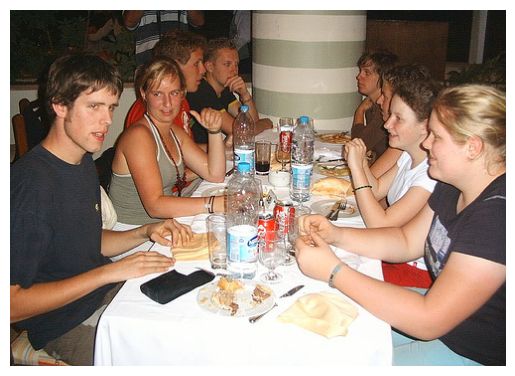

In [ ]:
img_show('2011_003262.jpg')

### 1.5 Addition of labels“is_multi_object”,"bbx_num"
- is_multi_object
> Indicates whether a single image file contains multiple objects for detection.

- bbx_num
> Specifies the total number of bounding boxes for a single image file.

In [ ]:
# Determine the number of bounding boxes for each image and name it as 'bbx_num', which will be used for multi-object detection information.
df_trainval = pd.merge(df_trainval, df_trainval.groupby('filename').size().reset_index(name='bbx_num'), on='filename')
df_test = pd.merge(df_test, df_test.groupby('filename').size().reset_index(name='bbx_num'), on='filename')
df_trainval['is_multi_object'] = (df_trainval['bbx_num'] > 1).astype(int)
df_test['is_multi_object'] = (df_test['bbx_num'] > 1).astype(int)

# df_trainval = df_trainval.drop('bbx_num',axis=1)
# df_test = df_test.drop('bbx_num',axis=1)

df_trainval

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,375,3,5,1
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,375,3,5,1
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,375,3,5,1
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,375,3,5,1
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,375,3,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47218,car,19.0,347.0,309.0,461.0,0,0,0,2011_003269.jpg,334,500,3,1,0
47219,bottle,98.0,1.0,499.0,405.0,1,0,0,2011_003271.jpg,500,500,3,1,0
47220,train,1.0,113.0,384.0,215.0,1,0,0,2011_003274.jpg,500,375,3,1,0
47221,aeroplane,42.0,50.0,448.0,282.0,0,0,0,2011_003275.jpg,500,403,3,1,0


### 1.6 Summary and Export as csv File

In [ ]:
a = len(df_trainval.groupby('filename').count())
b = len(df_trainval)
c = len(df_test.groupby('filename').count())
d = len(df_test)
print(f'trainval contains {a} image(s), with a total of {b} bounding box(es).')
print(f'test contains {c} image(s) , with a total of {d} bounding box(es).')
# len(df_trainval.groupby('filename').count())

trainval中包含16551张图片,共47223条边界框数据
test中包含4952张图片,共14976条边界框数据


# 2. Data Exploration

2.1 Data Quality

2.2 Data Distribution

2.3 Bounding Box Analysis

2.4 Image Quality

2.5 Data Selection

### **2.1 Data Quality**

2.1.1 Checking for Missing Values and Duplicates

2.1.2 Checking for Bounding Box Value

In [ ]:
if df_trainval.isna().sum().sum() > 0:
    print("There are missing values, please check:")
    print(df_trainval.isna().sum())
else:
    print("No missing value")

if df_trainval.duplicated().sum() > 0:
    print(f"There are missing values, {df_trainval.duplicated().sum()} in total")
    # Delete Duplicates
    df_trainval = df_trainval.drop_duplicates()
    print("Deleted Duplicates")
else:
    print("No Duplicate")


In [ ]:
if df_test.isna().sum().sum() > 0:
    print("There are missing values, please check:")
    print(df_test.isna().sum())
else:
    print("No missing value")

if df_test.duplicated().sum() > 0:
    print(f"There are missing values, {df_trainval.duplicated().sum()} in total")
    # Delete Duplicates
    df_test = df_trainval.drop_duplicates()
    print("Deleted Duplicates")
else:
    print("No Duplicate")

无空缺值
无重复项


#### 2.1.2 Bounding Box

In [ ]:
def check_bbox(df):
    # Check if xmin < xmax and ymin < ymax
    incorrect_bbox = df[(df['xmin'] >= df['xmax']) | (df['ymin'] >= df['ymax'])]

    if not incorrect_bbox.empty:
        print(f"Check the bounding boxes, {len(incorrect_bbox)} in total")
    else:
        print("All bounding boxes are reasonable")

check_bbox(df_trainval)
check_bbox(df_test)

所有边界框均合理
所有边界框均合理


### **2.2 Data Distribution**
- 2.2.1 Distribution of image object
- 2.2.2 Image size analysis
- 2.2.3 Distribution of object categories
- 2.2.4 Multiple object


#### 2.2.1 Distribution of image object

For each object, a bounding box is provided along with specified attributes such as ‘Orientation’, ‘Occluded’, ‘Truncated’, and ‘Difficult’. The label ‘Occluded’ introduced in the VOC2012 dataset, which was not present in the VOC2007 dataset.

Given that this project is particularly concentrated on object detection, our discussion will be limited to attributes labelled as ‘Difficult’, ‘Occluded’, and ‘Truncated’.

- Difficult: An object is challenging to detect due to reasons like small size, inadequate lighting, low image quality, or the necessity for considerable contextual interpretation.
- Occluded: More than 5% of the object is occluded within the bounding box, which means the object is not totally visible within the bounding box.
- Truncated: More than 15-20% of the object lies outside the bounding box, which means the bounding box does not cover the total extent of the object.

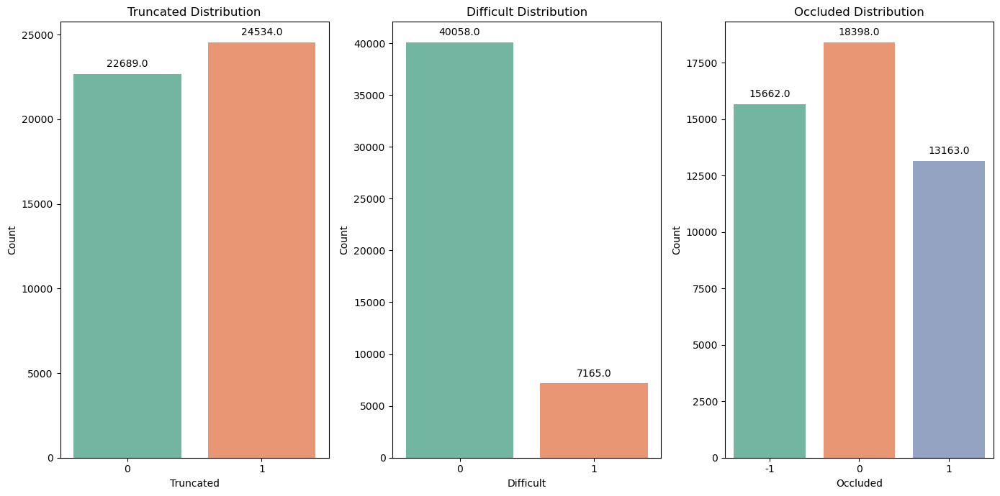

In [ ]:
# Set the image size
plt.figure(figsize=(14, 7))

# Plot the distribution of "truncated"
plt.subplot(1, 3, 1)
ax1 = sns.countplot(data=df_trainval, x='truncated', palette='Set2')
plt.title('Truncated Distribution')
plt.xlabel('Truncated')
plt.ylabel('Count')
for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center',
                 xytext=(0, 10), textcoords='offset points')

# Plot the distribution of "difficult"
plt.subplot(1, 3, 2)
ax2 = sns.countplot(data=df_trainval, x='difficult', palette='Set2')
plt.title('Difficult Distribution')
plt.xlabel('Difficult')
plt.ylabel('Count')
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center',
                 xytext=(0, 10), textcoords='offset points')

# Plot the distribution of "occluded"
plt.subplot(1, 3, 3)
ax3 = sns.countplot(data=df_trainval, x='occluded', palette='Set2')
plt.title('Occluded Distribution')
plt.xlabel('Occluded')
plt.ylabel('Count')
for p in ax3.patches:
    ax3.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center',
                 xytext=(0, 10), textcoords='offset points')

# Show the plot
plt.tight_layout()
plt.show()

Truncated: objects that are not fully visible in the image, highlighting the need for models to recognize partially visible objects.

Difficult: objects are a small subset that pose challenges due to factors like size, occlusion, or blending with the background. Considering these difficult samples during training improves the model's performance in complex scenarios.

Occlude: objects have varying levels of occlusion, making certain parts of the objects invisible and increasing recognition difficulty. Models should be capable of handling different degrees of occlusion to accurately identify the targets.

In [ ]:
df_test_clean = df_trainval[(df_trainval['truncated']==0) & (df_trainval['difficult']==0) & (df_trainval['occluded']==0)]
select_num = len(df_test_clean.groupby('filename').sum())
print(f'The total number of images filtered out that are not "truncated, difficult, occluded" is {select_num}')


筛选非“truncated、difficult、occluded”的图片的总数为6416


#### 2.2.2 Image Size Analysis
Analyzing the distribution of image sizes/resolutions based on width*height.

Most images follow a 4:3 aspect ratio and common resolutions, which may help us decide on the input data size or consider how to adjust image sizes during data augmentation to increase the model's generalization ability.

Reasons:
- The total number of pixels is directly related to the level of detail in the image and the amount of storage space it occupies. It is important to see if there is a need to optimize or adjust the model design for specific sizes of images.
- Investigating whether there are a large number of very large or very small images is crucial for designing data preprocessing workflows (such as image scaling strategies), choosing appropriate neural network input sizes, and optimizing the allocation of computing resources.
- It is also necessary to consider different aspect ratios (width-to-height ratios), which might affect the model's processing effectiveness differently.

In summary, an “img_size” label has been added to represent the size of an image as a value of width*height. The higher the value, the larger the image, the more pixels it contains, the higher the resolution, and potentially the more detailed features it might include.

##### **Exploration of Image Size of Trainval Set**
- Count: The same as shown in the loading section.
> Total of 16,551 unique images.

- Unique: The dataset exhibits considerable diversity in image sizes and ratios.
> There are 261 different widths, 339 different heights, 657 different image sizes, and 850 different aspect ratios.

- Frequency: Despite the high diversity in image sizes and ratios, most images still follow some common sizes and proportions.
> The most common image width is 500 (12,942 images), the most common height is 375 (6,958 images), and the most common image size is 187,500 (500x375, 8,356 images). The most common aspect ratio is 1.333333 (i.e. 4:3) (7,113 images).


In [ ]:
df_summary = df_trainval.groupby('filename').first().reset_index()

# Calculate image size and aspect ratio
df_summary['img_size'] = df_summary['width'] * df_summary['height']
df_summary['aspect_ratio'] = df_summary['width'] / df_summary['height']

In [ ]:
# Numerical summary
df_summary[['width','height','img_size','aspect_ratio']].describe()

,width,height,img_size,aspect_ratio
count,16551,16551,16551,16551.000000
unique,261,339,657,850.000000
top,500,375,187500,1.333333
freq,12942,6958,8356,7113.000000


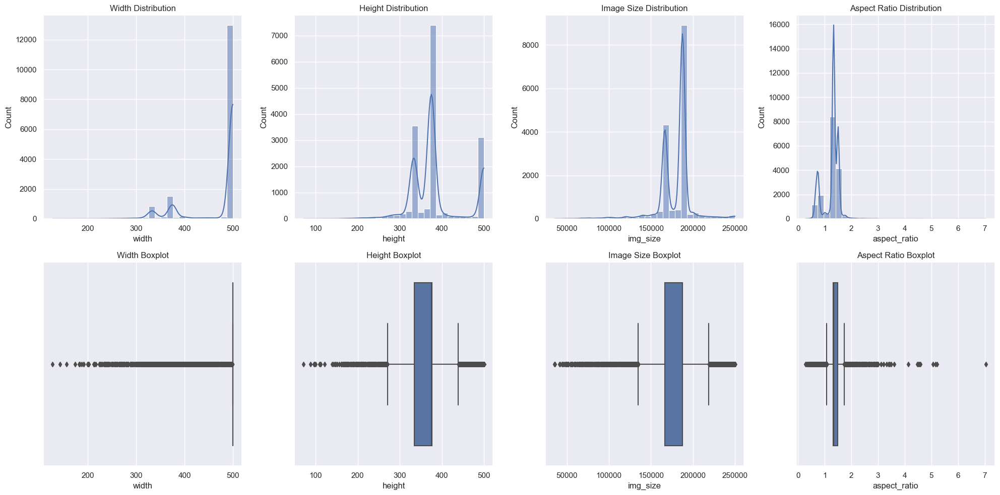

In [ ]:
# Set the graph style
sns.set(style="darkgrid")

# Plot the graph
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Histogram
sns.histplot(df_summary['width'], bins=30, kde=True, ax=axes[0, 0])
sns.histplot(df_summary['height'], bins=30, kde=True, ax=axes[0, 1])
sns.histplot(df_summary['img_size'], bins=30, kde=True, ax=axes[0, 2])
sns.histplot(df_summary['aspect_ratio'], bins=30, kde=True, ax=axes[0, 3])

# Boxplot
sns.boxplot(x=df_summary['width'], ax=axes[1, 0])
sns.boxplot(x=df_summary['height'], ax=axes[1, 1])
sns.boxplot(x=df_summary['img_size'], ax=axes[1, 2])
sns.boxplot(x=df_summary['aspect_ratio'], ax=axes[1, 3])

# Set the title
axes[0, 0].set_title('Width Distribution')
axes[0, 1].set_title('Height Distribution')
axes[0, 2].set_title('Image Size Distribution')
axes[0, 3].set_title('Aspect Ratio Distribution')
axes[1, 0].set_title('Width Boxplot')
axes[1, 1].set_title('Height Boxplot')
axes[1, 2].set_title('Image Size Boxplot')
axes[1, 3].set_title('Aspect Ratio Boxplot')

plt.tight_layout()
plt.show()

In [ ]:
df_trainval['img_size'] = df_trainval['width'] * df_trainval['height']
df_trainval

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,375,3,5,1,187500
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,375,3,5,1,187500
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,375,3,5,1,187500
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,375,3,5,1,187500
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,375,3,5,1,187500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47218,car,19.0,347.0,309.0,461.0,0,0,0,2011_003269.jpg,334,500,3,1,0,167000
47219,bottle,98.0,1.0,499.0,405.0,1,0,0,2011_003271.jpg,500,500,3,1,0,250000
47220,train,1.0,113.0,384.0,215.0,1,0,0,2011_003274.jpg,500,375,3,1,0,187500
47221,aeroplane,42.0,50.0,448.0,282.0,0,0,0,2011_003275.jpg,500,403,3,1,0,201500


##### **Exploration of the Image Size for Test Set**
> The overall image sizes of Test set are similar to Trainval set.

Comparison:
- The training set (df_trainval) consists of 16,551 images, while the test set (df_test) consists of 4,952 images.
- The range of image width and height values is slightly different between the training and test sets. The training set has 261 unique width values and 339 unique height values, while the test set has 165 and 256 unique values, respectively. This indicates that the distribution of image sizes is not entirely consistent between the training and test sets.
- Despite the different ranges of width and height values, the most common width and height values are the same in both the training and test sets, specifically 500 and 375.
- The distribution of image size (img_size) and aspect ratio (aspect_ratio) also shows slight differences. For example, although the most common values for image area and aspect ratio are the same, their frequencies of occurrence differ.

In [ ]:
df_summary_test = df_test.groupby('filename').first().reset_index()

# Calculate image size and aspect ratio
df_summary_test['img_size'] = df_summary_test['width'] * df_summary_test['height']
df_summary_test['aspect_ratio'] = df_summary_test['width'] / df_summary_test['height']
# Numerical Summary
df_summary_test[['width','height','img_size','aspect_ratio']].describe()

,width,height,img_size,aspect_ratio
count,4952,4952,4952,4952.000000
unique,165,256,401,481.000000
top,500,375,187500,1.333333
freq,3895,2090,2467,2126.000000


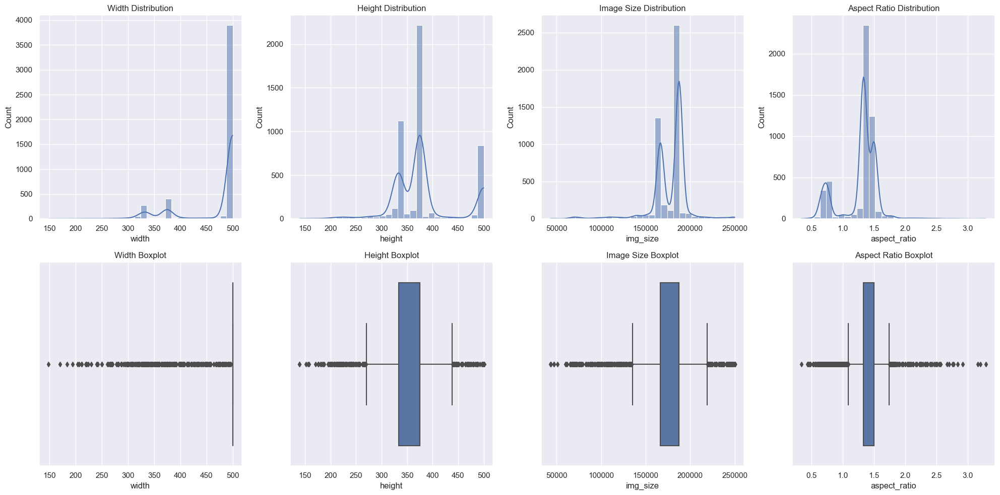

In [ ]:
# Set the graph style
sns.set(style="darkgrid")

# Plot the graph
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Histogram
sns.histplot(df_summary_test['width'], bins=30, kde=True, ax=axes[0, 0])
sns.histplot(df_summary_test['height'], bins=30, kde=True, ax=axes[0, 1])
sns.histplot(df_summary_test['img_size'], bins=30, kde=True, ax=axes[0, 2])
sns.histplot(df_summary_test['aspect_ratio'], bins=30, kde=True, ax=axes[0, 3])

# Boxplot
sns.boxplot(x=df_summary_test['width'], ax=axes[1, 0])
sns.boxplot(x=df_summary_test['height'], ax=axes[1, 1])
sns.boxplot(x=df_summary_test['img_size'], ax=axes[1, 2])
sns.boxplot(x=df_summary_test['aspect_ratio'], ax=axes[1, 3])

# Set the title
axes[0, 0].set_title('Width Distribution')
axes[0, 1].set_title('Height Distribution')
axes[0, 2].set_title('Image Size Distribution')
axes[0, 3].set_title('Aspect Ratio Distribution')
axes[1, 0].set_title('Width Boxplot')
axes[1, 1].set_title('Height Boxplot')
axes[1, 2].set_title('Image Size Boxplot')
axes[1, 3].set_title('Aspect Ratio Boxplot')

plt.tight_layout()
plt.show()

In [ ]:
df_test['img_size'] = df_test['width'] * df_test['height']
df_test

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size
0,dog,48.0,240.0,195.0,371.0,1,0,-1,000001.jpg,353,500,3,2,1,176500
1,person,8.0,12.0,352.0,498.0,1,0,-1,000001.jpg,353,500,3,2,1,176500
2,train,139.0,200.0,207.0,301.0,0,0,-1,000002.jpg,335,500,3,1,0,167500
3,sofa,123.0,155.0,215.0,195.0,0,0,-1,000003.jpg,500,375,3,2,1,187500
4,chair,239.0,156.0,307.0,205.0,0,0,-1,000003.jpg,500,375,3,2,1,187500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14971,person,162.0,72.0,273.0,248.0,1,0,-1,009962.jpg,500,375,3,5,1,187500
14972,person,250.0,68.0,473.0,312.0,1,0,-1,009962.jpg,500,375,3,5,1,187500
14973,person,4.0,2.0,253.0,374.0,1,0,-1,009962.jpg,500,375,3,5,1,187500
14974,diningtable,358.0,216.0,500.0,375.0,1,1,-1,009962.jpg,500,375,3,5,1,187500


#### 2.2.3 Object Class Distribution

- In both trainval dataset and the test dataset, the category with the highest number of samples is "person" (a total of 8,566 image files). (This could be due to the addition of a task related to human action recognition in the dataset introduced in the 12th year?)

- There are a small number of image files (less than 1,000) for the following categories: cow (582), sheep (521), bus (810), and boat (880).

Overall, there is an imbalance in the number of samples among different categories.

Class imbalance can affect the training and evaluation of models because the model may have a bias towards recognizing more frequently occurring categories while ignoring others. Therefore, it is necessary to consider how to address this imbalance during model training, such as adjusting the weights of the loss function, using oversampling or undersampling techniques, etc.

In [ ]:
df_trainval_draw = df_trainval.copy()
df_test_draw = df_test.copy()

# Add new columns
df_trainval_draw['dataset'] = 'trainval'
df_test_draw['dataset'] = 'test'

# Merge
df_combined = pd.concat([df_trainval_draw, df_test_draw], ignore_index=True)

# Count the number of images per class among the 20 categories
# "count" = the number of bounding boxes
# "unique" = the number of unique image files
df_combined.groupby('class')['filename'].describe()

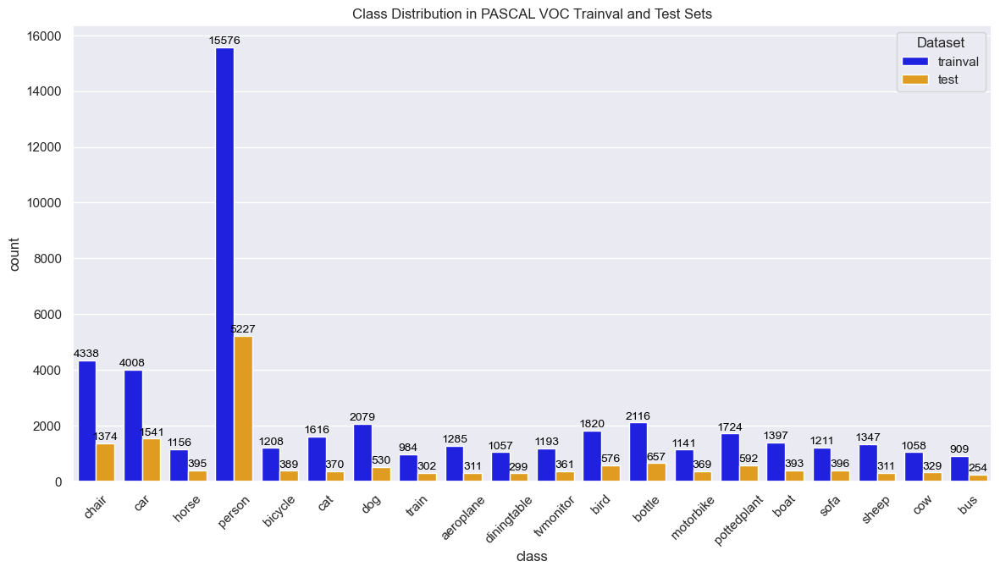

In [ ]:
plt.figure(figsize=(14, 7))
ax = sns.countplot(data=df_combined, x='class', hue='dataset', palette=['blue', 'orange'])

# Plot the distributio of object classes by training set and test set
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.title('Class Distribution in PASCAL VOC Trainval and Test Sets')
plt.xticks(rotation=45)
plt.legend(title='Dataset')

plt.show()

In [ ]:
df_trainval[df_trainval['filename']=='2008_007069.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size
25693,sheep,411.0,172.0,445.0,195.0,0,0,0,2008_007069.jpg,500,375,3,56,1,187500
25694,sheep,183.0,186.0,219.0,215.0,0,0,0,2008_007069.jpg,500,375,3,56,1,187500
25695,sheep,206.0,201.0,260.0,249.0,0,0,0,2008_007069.jpg,500,375,3,56,1,187500
25696,sheep,321.0,202.0,381.0,258.0,0,0,0,2008_007069.jpg,500,375,3,56,1,187500
25697,sheep,368.0,217.0,397.0,256.0,0,0,0,2008_007069.jpg,500,375,3,56,1,187500
25698,sheep,482.0,190.0,500.0,234.0,1,1,0,2008_007069.jpg,500,375,3,56,1,187500
25699,sheep,138.0,197.0,164.0,221.0,0,0,0,2008_007069.jpg,500,375,3,56,1,187500
25700,sheep,137.0,160.0,155.0,177.0,0,1,0,2008_007069.jpg,500,375,3,56,1,187500
25701,sheep,119.0,160.0,136.0,172.0,0,1,1,2008_007069.jpg,500,375,3,56,1,187500
25702,sheep,118.0,166.0,132.0,175.0,0,1,0,2008_007069.jpg,500,375,3,56,1,187500


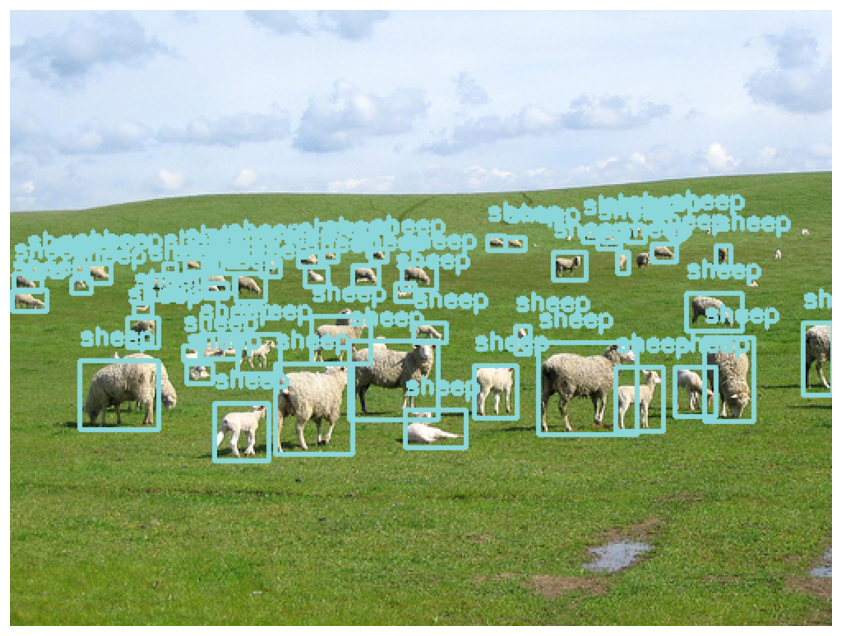

In [ ]:
vis_image(df_trainval, '2008_007069.jpg')

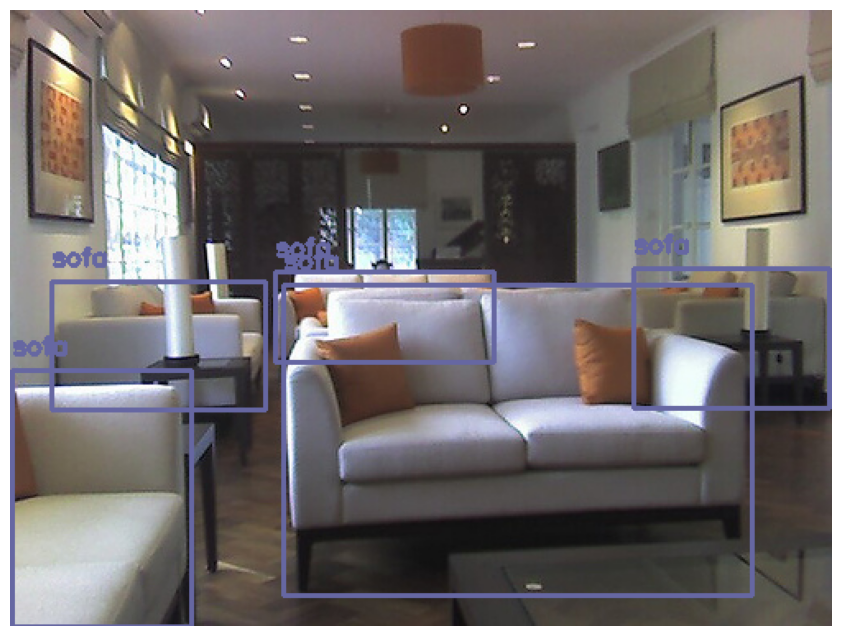

In [ ]:
# 2008_006737.jpg
vis_image(df_trainval, '2008_006737.jpg')

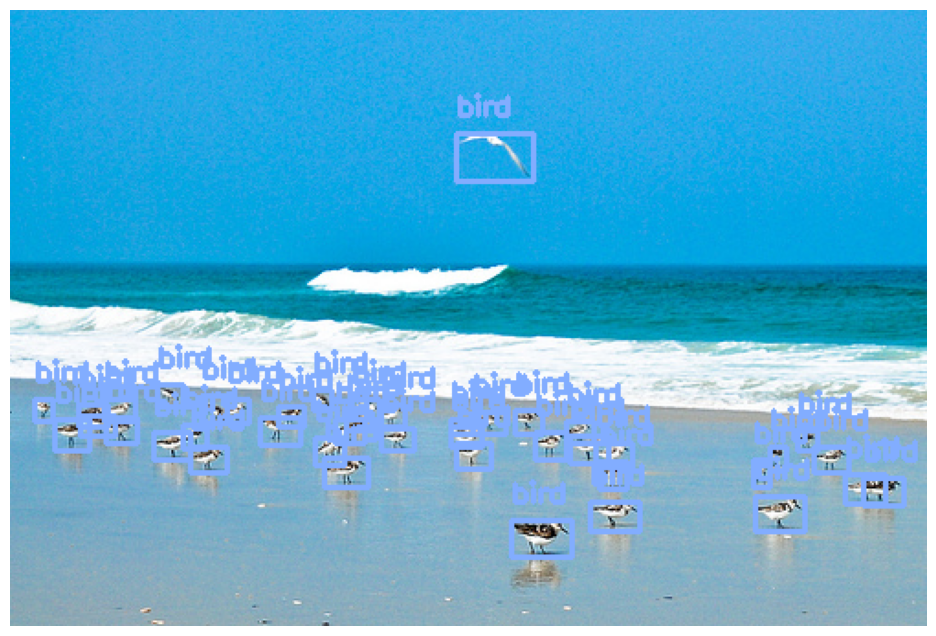

In [ ]:
# 2008_006503.jpg
vis_image(df_trainval, '2008_006503.jpg')

#### 2.2.4 Multi-object

> After merging the trainval and test sets, a comparison is made between the total number of images and the total number of bounding boxes for all images based on the 20 object categories.

**Add the label 'is_multi_class'**

When the number of bounding boxes in single image is greater than 1 (i.e., is_multi_object > 1), it indicates that the image contains multiple objects. In such cases, the following situations may arise:
> - Multiple objects of different categories
> - Multiple objects of the same category

Considering that for multi-object recognition tasks on the same image, the presence of different categories of objects versus multiple instances of the same category of object may potentially affect the model's preferences or pattern learning, the "is_multi_class" label is added. It can be used for evaluating and fine-tuning the model's performance from a different perspective and explaining the model's strengths and weaknesses.

For example, in specific business scenarios such as traffic, the model may need to recognize pedestrians crossing the road on the sidewalk or vehicles on the road, rather than birds crossing the road or people passing by on the road. In such cases, the model's focus may be more on identifying individuals of the same category in multi-object detection rather than different categories of objects. (differences between recognition and detection tasks?)

Therefore, the addition of this label indicates whether an image contains multiple objects of different categories (is_multi_class = 1) or solely instances of the same category (is_multi_class = 0).

In [ ]:
# Calculate the total number of images and bounding boxes for each category
# "image_counts" = the number of images in each category
# "bbox_counts" = the total number of bounding boxes for that category
image_counts = df_combined.groupby('class')['filename'].nunique()
bbox_counts = df_combined.groupby('class').size()

class_stats = pd.DataFrame({'Image_count': image_counts, 'bbx_count': bbox_counts})
class_stats['bbx_count/Image_count'] = class_stats['bbx_count'] / class_stats['Image_count']
class_stats

,Image_count,bbx_count,bbx_count/Image_count
class,,,
aeroplane,1121,1596,1.423729
bicycle,1076,1597,1.484201
bird,1395,2396,1.717563
boat,880,1790,2.034091
bottle,1270,2773,2.183465
bus,810,1163,1.435802
car,2765,5549,2.006872
cat,1760,1986,1.128409
chair,2415,5712,2.365217


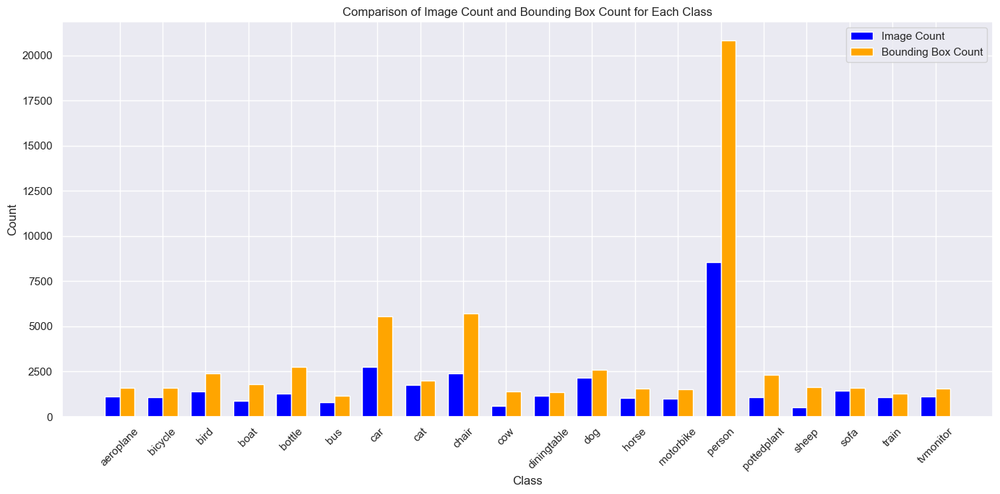

In [ ]:
# Total number of images and bounding boxes
class_labels = class_stats.index
image_counts = class_stats['Image_count']
bbox_counts = class_stats['bbx_count']

# Plot the graph
bar_width = 0.35
index = np.arange(len(class_labels))

plt.figure(figsize=(14, 7))
plt.rcParams.update({'font.size': 12})

plt.bar(index, image_counts, bar_width, label='Image Count', color='blue')
plt.bar(index + bar_width, bbox_counts, bar_width, label='Bounding Box Count', color='orange')

plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Comparison of Image Count and Bounding Box Count for Each Class')
plt.xticks(index + bar_width / 2, class_labels, rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Calculate the ratio of bounding box and number of images
# Categories with a ratio >2 may indicate that they have more object counts either within the single image or the entire dataset
class_stats[class_stats['bbx_count/Image_count']>2]

,Image_count,bbx_count,bbx_count/Image_count
class,,,
boat,880,1790,2.034091
bottle,1270,2773,2.183465
car,2765,5549,2.006872
chair,2415,5712,2.365217
cow,582,1387,2.383162
person,8566,20803,2.428555
pottedplant,1095,2316,2.115068
sheep,521,1658,3.182342


In [ ]:
df_trainval[(df_trainval['class'] == 'boat') & (df_trainval['bbx_num'] >3)][['filename','bbx_num']]

,filename,bbx_num
96,000073.jpg,4
243,000184.jpg,4
244,000184.jpg,4
245,000184.jpg,4
246,000184.jpg,4
...,...,...
46860,2011_003020.jpg,7
46869,2011_003025.jpg,4
46870,2011_003025.jpg,4
46871,2011_003025.jpg,4


In [ ]:
df_trainval[df_trainval['filename'] == '2011_003020.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size
46859,boat,242.0,201.0,334.0,329.0,0,0,0,2011_003020.jpg,500,332,3,7,1,166000
46860,boat,396.0,286.0,500.0,332.0,1,1,0,2011_003020.jpg,500,332,3,7,1,166000
46861,person,446.0,266.0,484.0,297.0,1,1,0,2011_003020.jpg,500,332,3,7,1,166000
46862,person,457.0,252.0,487.0,288.0,1,1,1,2011_003020.jpg,500,332,3,7,1,166000
46863,person,305.0,285.0,321.0,322.0,0,0,0,2011_003020.jpg,500,332,3,7,1,166000
46864,person,260.0,300.0,278.0,322.0,0,1,0,2011_003020.jpg,500,332,3,7,1,166000
46865,person,282.0,308.0,295.0,324.0,1,1,1,2011_003020.jpg,500,332,3,7,1,166000


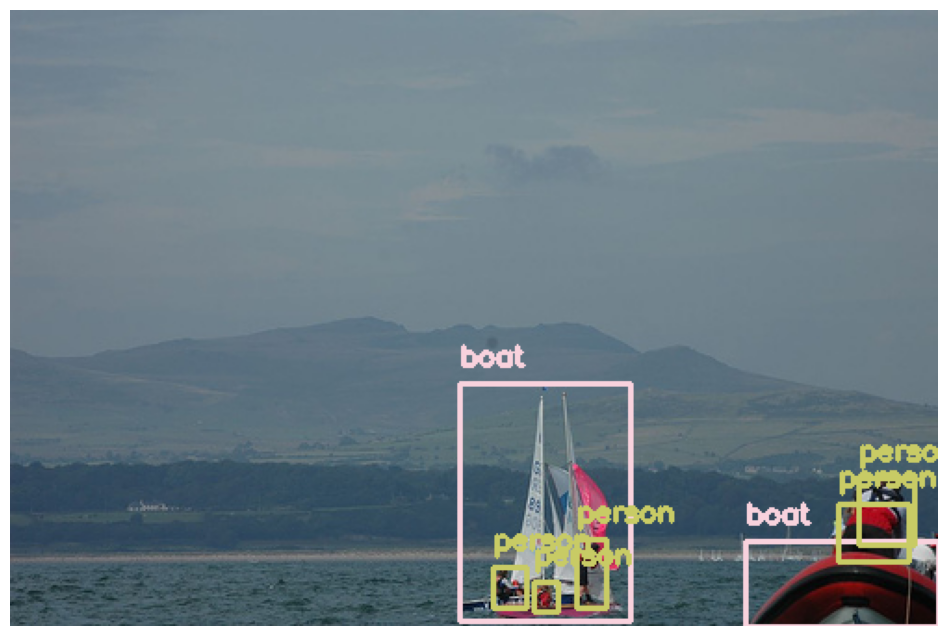

In [ ]:
vis_image(df_trainval,'2011_003020.jpg')

In [ ]:
# Check the number of categories of each filename
class_counts_per_image = df_trainval.groupby('filename')['class'].nunique()
class_counts_per_image_test = df_test.groupby('filename')['class'].nunique()

# Create a new label to identify if a single image contains multple objects in differenct categories
df_trainval['is_multi_class'] = df_trainval['filename'].apply(
    lambda x: 1 if class_counts_per_image[x] > 1 else 0)
df_test['is_multi_class'] = df_test['filename'].apply(
    lambda x: 1 if class_counts_per_image_test[x] > 1 else 0)

df_trainval[(df_trainval['is_multi_class'] == 0) & (df_trainval['is_multi_object'] == 1)]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,375,3,5,1,187500,0
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,375,3,5,1,187500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47153,person,180.0,106.0,323.0,375.0,0,0,1,2011_003238.jpg,500,375,3,2,1,187500,0
47180,horse,245.0,201.0,375.0,434.0,1,0,1,2011_003253.jpg,375,500,3,2,1,187500,0
47181,horse,1.0,23.0,274.0,500.0,1,0,1,2011_003253.jpg,375,500,3,2,1,187500,0
47185,person,1.0,50.0,284.0,375.0,1,0,0,2011_003255.jpg,500,375,3,2,1,187500,0


In [ ]:
df_trainval[df_trainval['filename'] == '000017.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class
12,person,185.0,62.0,279.0,199.0,0,0,-1,000017.jpg,480,364,3,2,1,174720,1
13,horse,90.0,78.0,403.0,336.0,0,0,-1,000017.jpg,480,364,3,2,1,174720,1


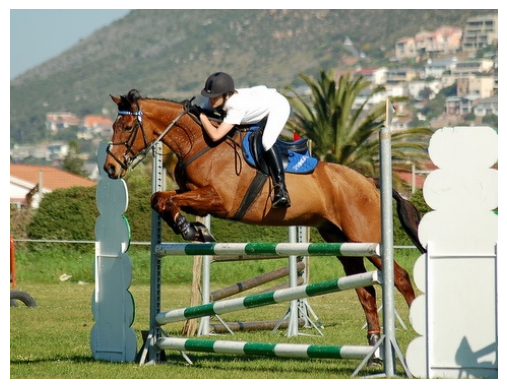

In [ ]:
img_show('000017.jpg')

### **2.3 Bounding Box Analysis**
2.3.1 General Statistics of the bounding box

2.3.2 Exploration of bounding box sizes and aspect ratio

2.3.3 Exploration of bounding box positions

2.3.4 Small object detection

#### 2.3.1 General Statistics of the bounding box

**Bounding Box Width and Height**
- Average width and height of the bounding boxes: approximately 154 and 157 pixels respectively
- Standard deviations for width and height: approximately 133 and 113 pixels (indicating significant variations in the sizes of the bounding boxes)
- Range of width and height values: [2, 499] and [4, 499] respectively (very large range)
> Overall, the bounding boxes exhibit diverse scales, necessitating different handling strategies for objects of different sizes, such as multi-scale feature extraction, region proposal adjustments, and modifications to the design of the detection head.

**Size**
- Average size of the bounding boxes: approximately 34231 pixels

**Aspect Ratio**
- The average aspect ratio of the bounding boxes: approximately 1.09 (similar to square-shaped boxes)
- Large standard deviation suggests significant variations in the shapes and sizes of the objects, indicating that the targets may have various shapes and sizes.

**Positions（bbox_central_x & bbox_central_y）：**
- The average coordinates of the bounding box center:（238.51, 205.55）
- The standard deviations for the bounding box center coordinates: 114.48 and 75.15 (indicating dispersion)

In [ ]:
df_bbx_analysis = df_trainval.copy()

# Calculate the width and height of the bounding boxes
df_bbx_analysis['bbx_width'] = df_bbx_analysis['xmax'] - df_bbx_analysis['xmin']
df_bbx_analysis['bbx_height'] = df_bbx_analysis['ymax'] - df_bbx_analysis['ymin']

# Calculate the size of the bounding boxes
df_bbx_analysis['bbx_size'] = df_bbx_analysis['bbx_width'] * df_bbx_analysis['bbx_height']
df_bbx_analysis['bbx_aspect_ratio'] = df_bbx_analysis['bbx_width'] / df_bbx_analysis['bbx_height']

# Calculate the relative positions of the bounding box centers
df_bbx_analysis['bbx_central_x'] = (df_bbx_analysis['xmax'] + df_bbx_analysis['xmin'])/2
df_bbx_analysis['bbx_central_y'] = (df_bbx_analysis['ymax'] + df_bbx_analysis['ymin'])/2

##### **Bounding Box Width and Height**

In [ ]:
df_bbx_analysis[['bbx_width','bbx_height']].describe()

,bbx_width,bbx_height
count,47223.000000,47223.000000
mean,154.008830,157.474769
std,133.126777,112.907296
min,2.000000,4.000000
25%,49.000000,62.000000
50%,108.000000,131.000000
75%,227.000000,234.500000
max,499.000000,499.000000


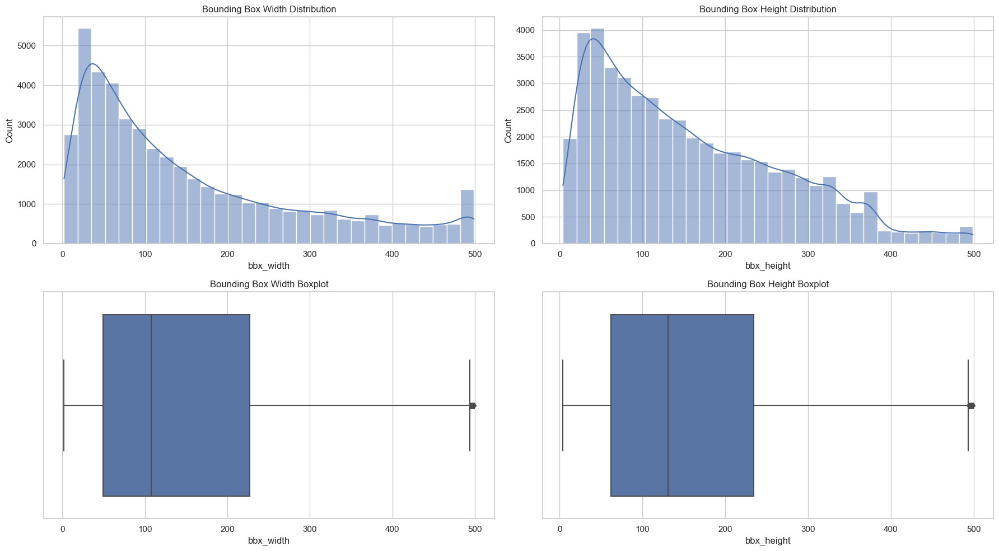

In [ ]:
# Set the graph style
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot a histrogram of Bounding Box Width
sns.histplot(df_bbx_analysis['bbx_width'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Bounding Box Width Distribution')

# Plot a histrogram of Bounding Box Height
sns.histplot(df_bbx_analysis['bbx_height'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Bounding Box Height Distribution')

# Plot a boxplot of Bounding Box Width
sns.boxplot(x=df_bbx_analysis['bbx_width'], ax=axes[1, 0])
axes[1, 0].set_title('Bounding Box Width Boxplot')

# Plot a boxplot of Bounding Box Height
sns.boxplot(x=df_bbx_analysis['bbx_height'], ax=axes[1, 1])
axes[1, 1].set_title('Bounding Box Height Boxplot')

# Show the graph
plt.tight_layout()
plt.show()


##### **Bounding Box Size and Aspect Ratio**

In [ ]:
df_bbx_analysis[['bbx_size','bbx_aspect_ratio']].describe()

,bbx_size,bbx_aspect_ratio
count,47223.000000,47223.000000
mean,34231.236135,1.092470
std,43611.355271,0.837368
min,14.000000,0.071186
25%,3128.000000,0.553398
50%,14322.000000,0.869565
75%,49988.500000,1.367619
max,249001.000000,20.625000


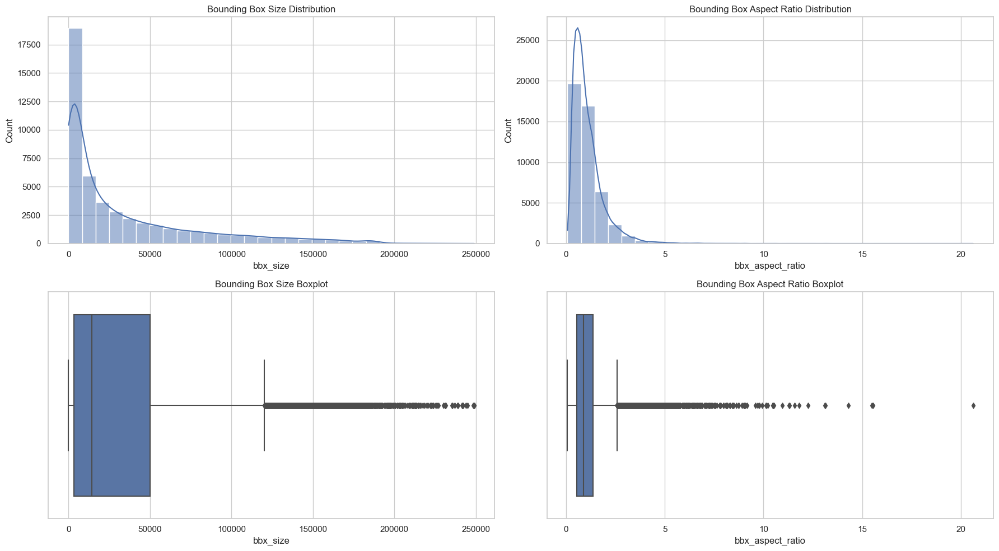

In [ ]:
# Set the graph style
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot a histogram of Bounding Box Size
sns.histplot(df_bbx_analysis['bbx_size'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Bounding Box Size Distribution')

# Plot a histogram of Bounding Box Aspect Ratio
sns.histplot(df_bbx_analysis['bbx_aspect_ratio'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Bounding Box Aspect Ratio Distribution')

# Plot a boxplot of Bounding Box Size
sns.boxplot(x=df_bbx_analysis['bbx_size'], ax=axes[1, 0])
axes[1, 0].set_title('Bounding Box Size Boxplot')

# Plot a boxplot of Bounding Box Aspect Ratio
sns.boxplot(x=df_bbx_analysis['bbx_aspect_ratio'], ax=axes[1, 1])
axes[1, 1].set_title('Bounding Box Aspect Ratio Boxplot')

# Show the graph
plt.tight_layout()
plt.show()


##### **Bounding Box Center**

In [ ]:
df_bbx_analysis[['bbx_central_x','bbx_central_y']].describe()

,bbx_central_x,bbx_central_y
count,47223.000000,47223.000000
mean,238.511350,205.549362
std,114.483642,75.146758
min,4.500000,5.500000
25%,158.000000,162.000000
50%,239.500000,201.500000
75%,314.000000,250.500000
max,498.000000,495.000000


In [ ]:
df_bbx_analysis[['bbx_width','bbx_height','bbx_size','bbx_aspect_ratio','bbx_central_x','bbx_central_y']].describe()

,bbx_width,bbx_height,bbx_size,bbx_aspect_ratio,bbx_central_x,bbx_central_y
count,47223.000000,47223.000000,47223.000000,47223.000000,47223.000000,47223.000000
mean,154.008830,157.474769,34231.236135,1.092470,238.511350,205.549362
std,133.126777,112.907296,43611.355271,0.837368,114.483642,75.146758
min,2.000000,4.000000,14.000000,0.071186,4.500000,5.500000
25%,49.000000,62.000000,3128.000000,0.553398,158.000000,162.000000
50%,108.000000,131.000000,14322.000000,0.869565,239.500000,201.500000
75%,227.000000,234.500000,49988.500000,1.367619,314.000000,250.500000
max,499.000000,499.000000,249001.000000,20.625000,498.000000,495.000000


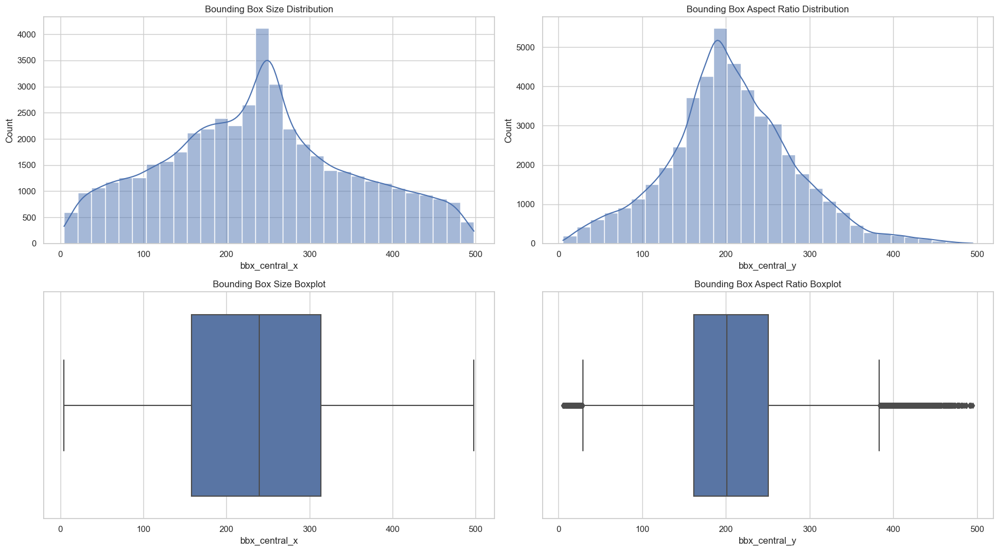

In [ ]:
# Set the graph style
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot a histogram of x-coordinate of Bounding Box Center
sns.histplot(df_bbx_analysis['bbx_central_x'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Distribution of x-coordinate of Bounding Box Center')

# Plot a histogram of y-coordinate of Bounding Box Center
sns.histplot(df_bbx_analysis['bbx_central_y'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of y-coordinate of Bounding Box Center')

# Plot a boxplot of x-coordinate of Bounding Box Center
sns.boxplot(x=df_bbx_analysis['bbx_central_x'], ax=axes[1, 0])
axes[1, 0].set_title('Boxplot of x-coordinate of Bounding Box Center')

# Plot a boxplot of y-coordinate of Bounding Box Center
sns.boxplot(x=df_bbx_analysis['bbx_central_y'], ax=axes[1, 1])
axes[1, 1].set_title('Boxplot of y-coordinate of Bounding Box Center')

# Show the graph
plt.tight_layout()
plt.show()

#### 2.3.2 Exploration of bounding box sizes & aspect ratio

Analyzing the distribution of bounding box sizes and aspect ratios can help in understanding the scale variations of bounding boxes in the dataset and guide model design and data preprocessing strategies.

##### **The maximum and minimum value of the bounding box**
> Max = 24,9001 when Min = 14

In [ ]:
# Find the image with the largest bounding box
df_bbx_analysis[df_bbx_analysis['bbx_size']==249001]

In [ ]:
df_bbx_analysis[df_bbx_analysis['filename']=='2008_004970.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,...,bbx_num,is_multi_object,img_size,is_multi_class,bbx_width,bbx_height,bbx_size,bbx_aspect_ratio,bbx_central_x,bbx_central_y
22717,motorbike,1.0,1.0,500.0,500.0,1,0,0,2008_004970.jpg,500,...,1,0,250000,0,499.0,499.0,249001.0,1.0,250.5,250.5


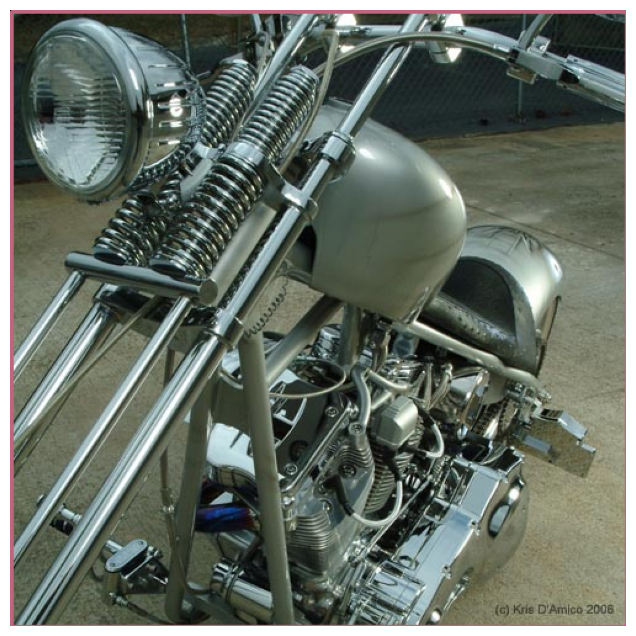

In [ ]:
# Show the image with the largest bounding box
vis_image(df_trainval, '2008_004970.jpg')

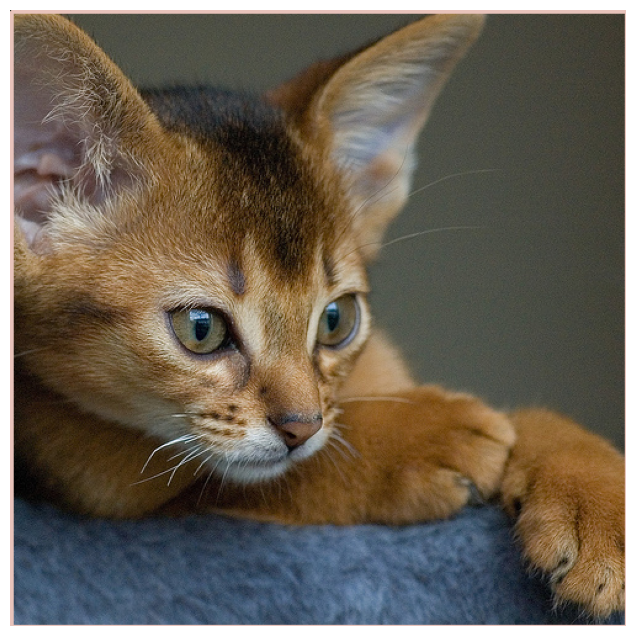

In [ ]:
# Show the image with the largest bounding box
vis_image(df_trainval, '2010_005082.jpg')

In [ ]:
# Find the image with the smallest bounding box
df_bbx_analysis[df_bbx_analysis['bbx_size']==14]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,...,bbx_num,is_multi_object,img_size,is_multi_class,bbx_width,bbx_height,bbx_size,bbx_aspect_ratio,bbx_central_x,bbx_central_y
37518,person,127.0,249.0,129.0,256.0,0,1,0,2010_001966.jpg,480,...,12,1,172800,1,2.0,7.0,14.0,0.285714,128.0,252.5


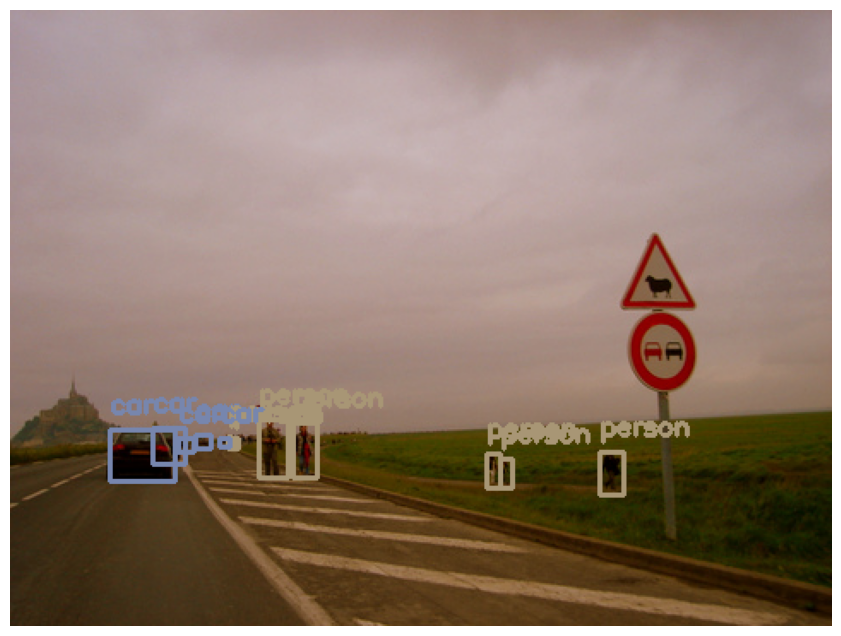

In [ ]:
# Show the image with the smallest bounding box
vis_image(df_trainval, '2010_001966.jpg')

In [ ]:
# Filter the image with bounding box width larger than 490
df_bbx_analysis[df_bbx_analysis.bbx_width > 490]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,...,bbx_num,is_multi_object,img_size,is_multi_class,bbx_width,bbx_height,bbx_size,bbx_aspect_ratio,bbx_central_x,bbx_central_y
44,diningtable,3.0,304.0,500.0,375.0,1,1,-1,000035.jpg,500,...,4,1,187500,1,497.0,71.0,35287.0,7.000000,251.5,339.5
146,aeroplane,1.0,42.0,498.0,284.0,1,0,-1,000117.jpg,500,...,1,0,166500,0,497.0,242.0,120274.0,2.053719,249.5,163.0
163,boat,4.0,1.0,500.0,249.0,1,0,-1,000130.jpg,500,...,1,0,187500,0,496.0,248.0,123008.0,2.000000,252.0,125.0
178,sofa,2.0,113.0,500.0,401.0,1,0,-1,000140.jpg,500,...,2,1,200500,1,498.0,288.0,143424.0,1.729167,251.0,257.0
206,car,1.0,16.0,498.0,333.0,1,0,-1,000159.jpg,500,...,2,1,166500,1,497.0,317.0,157549.0,1.567823,249.5,174.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47075,diningtable,3.0,109.0,498.0,375.0,0,0,1,2011_003166.jpg,500,...,4,1,187500,1,495.0,266.0,131670.0,1.860902,250.5,242.0
47101,sofa,1.0,22.0,500.0,375.0,1,0,1,2011_003182.jpg,500,...,1,0,187500,0,499.0,353.0,176147.0,1.413598,250.5,198.5
47108,car,1.0,65.0,500.0,367.0,1,0,1,2011_003185.jpg,500,...,2,1,187500,1,499.0,302.0,150698.0,1.652318,250.5,216.0
47111,sofa,4.0,1.0,499.0,163.0,1,0,1,2011_003188.jpg,500,...,2,1,187500,1,495.0,162.0,80190.0,3.055556,251.5,82.0


In [ ]:
# Filter the image with bounding box aspect ratio larger than 5
df_bbx_analysis[df_bbx_analysis.bbx_aspect_ratio > 5]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,...,bbx_num,is_multi_object,img_size,is_multi_class,bbx_width,bbx_height,bbx_size,bbx_aspect_ratio,bbx_central_x,bbx_central_y
44,diningtable,3.0,304.0,500.0,375.0,1,1,-1,000035.jpg,500,...,4,1,187500,1,497.0,71.0,35287.0,7.000000,251.5,339.5
197,car,47.0,114.0,118.0,125.0,1,1,-1,000153.jpg,500,...,4,1,187500,0,71.0,11.0,781.0,6.454545,82.5,119.5
366,car,1.0,474.0,149.0,500.0,1,1,-1,000251.jpg,453,...,7,1,226500,1,148.0,26.0,3848.0,5.692308,75.0,487.0
614,train,1.0,168.0,308.0,209.0,1,0,-1,000439.jpg,500,...,1,0,166500,0,307.0,41.0,12587.0,7.487805,154.5,188.5
773,car,95.0,191.0,124.0,195.0,1,1,-1,000541.jpg,500,...,8,1,166500,1,29.0,4.0,116.0,7.250000,109.5,193.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46315,diningtable,257.0,228.0,500.0,264.0,1,0,1,2011_002714.jpg,500,...,5,1,187500,1,243.0,36.0,8748.0,6.750000,378.5,246.0
46359,sofa,24.0,310.0,440.0,375.0,1,0,0,2011_002752.jpg,500,...,1,0,187500,0,416.0,65.0,27040.0,6.400000,232.0,342.5
46652,diningtable,108.0,304.0,500.0,374.0,1,0,0,2011_002920.jpg,500,...,38,1,187000,1,392.0,70.0,27440.0,5.600000,304.0,339.0
46926,diningtable,1.0,178.0,499.0,238.0,1,0,0,2011_003050.jpg,500,...,8,1,119000,1,498.0,60.0,29880.0,8.300000,250.0,208.0


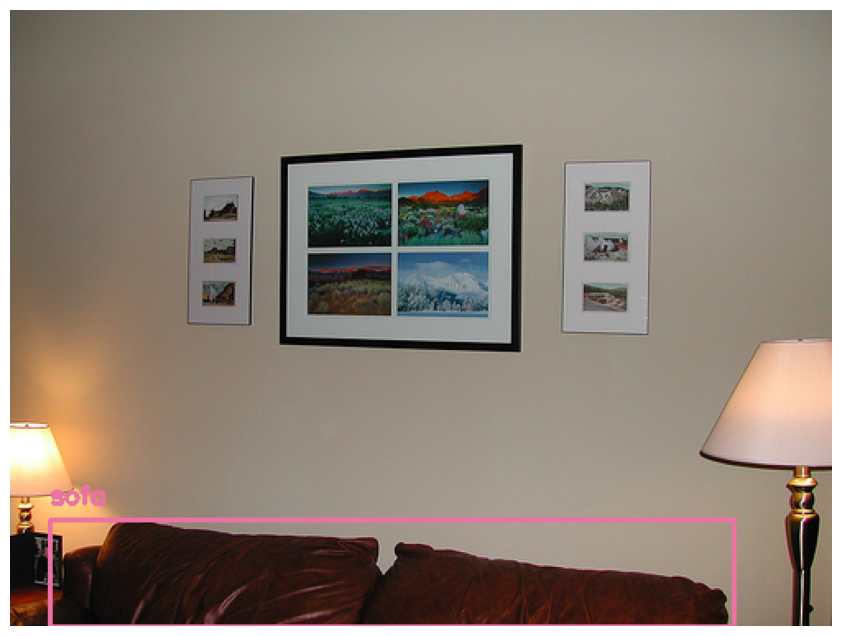

In [ ]:
# Show the sample of image with bounding box aspect ratio larger than 5
vis_image(df_trainval, '2011_002752.jpg')

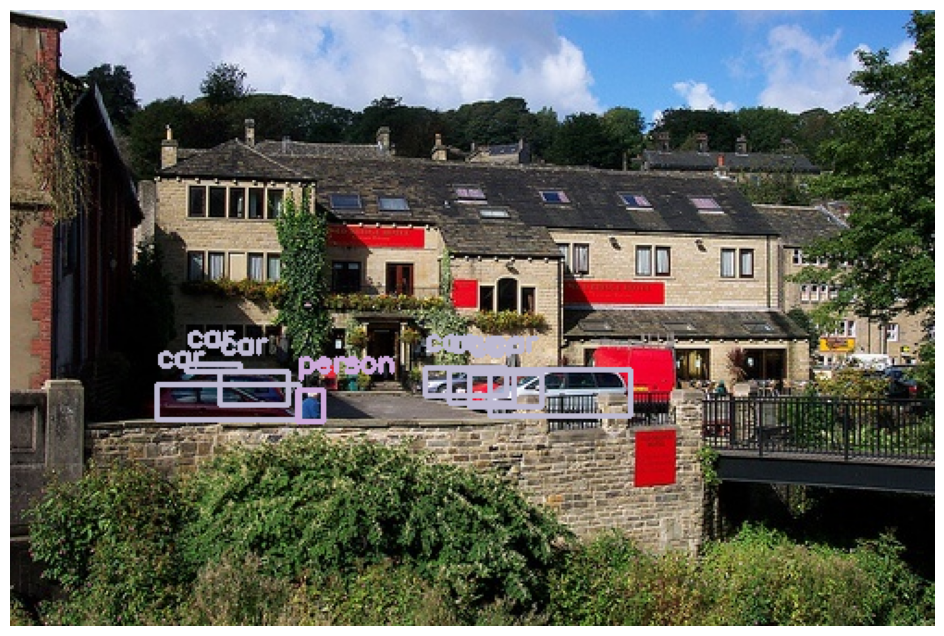

In [ ]:
# Show the sample of image with bounding box aspect ratio larger than 5
vis_image(df_trainval, '000541.jpg')

#### 2.3.3 Exploration of bounding box positions

- The image is divided into a 4*4 grid (region) to analyze where the center of the bounding boxes is located.
>Example of image division:
>
>1 | 2 | 3 | 4
>
>5 | 6 | 7 | 8
>
>9 |10|11|12
>
>13|14|15|16

- Histograms show a tendency for the centers of bounding boxes to cluster in regions 5, 6, 9, and 10.
> The location of the detected objects may be close to the middle-left side of the image.
>
> Is this due to photography composition habits? It's also possible that multiple images have multiple targets concentrated in specific areas.

- The boxplot shows that most data is between 6 and 10 (with Q1 at 6, Q3 at 10, and the median Q2 at 9).
> Most bounding box data is concentrated in regions 6-10, particularly near regions 9 & 10, according to the histogram above.

However, if the bounding box (bbx) is large relative to the image, then the center of the bbx will largely be near the center of the image (regions 6, 7, 9, 10), which could introduce errors in the conclusions.

Consideration could be given to whether new features need to be developed to capture information, such as features for clustering of bounding box centers, offset of bounding box center relative to image center, or features measuring the number of bounding boxes in a specific region.

In [ ]:
# Divide the image into 16 regions (4x4 grid)
NUM_ROWS = 4
NUM_COLS = 4

# Map the center position of the bounding box to the corresponding region number
def map_to_region(x, y):
    row = int(y / (1/NUM_ROWS))
    col = int(x / (1/NUM_COLS))
    return row * NUM_COLS + col

# Calculate the region number where the center of the bounding box is located
df_bbx_analysis['region'] = df_bbx_analysis.apply(
    lambda row: map_to_region((row['bbx_central_x'] / row['width']),
                              (row['bbx_central_y'] / row['height'])), axis=1)

# Count the number of bounding boxes in each region
region_counts = df_bbx_analysis['region'].value_counts().sort_index()

# x-coordinate
df_bbx_analysis.groupby('region')[['filename','bbx_central_x']].describe()

bbx_central_x                                                          \
               count        mean        std    min      25%     50%      75%   
region                                                                         
0              675.0   64.427407  32.093103    5.0   37.000   63.00   91.250   
1              845.0  179.800592  39.775155   91.0  147.500  178.00  215.500   
2              879.0  293.785552  47.970673  169.5  261.500  294.50  331.500   
3              803.0  411.244085  54.137584  229.5  387.750  416.00  453.500   
4             2275.0   67.701538  32.928859    5.5   40.000   68.00   95.500   
5             4436.0  189.475879  40.393918   58.5  157.375  190.25  226.625   
6             4601.0  282.644208  48.210624   92.0  254.000  278.00  318.500   
7             2286.0  412.612205  53.520515  204.0  386.500  417.50  453.000   
8             3519.0   71.528701  32.356073    4.5   46.500   74.00   99.000   
9             8567.0  189.613342  40.903673   62.0  156.500  192.00  227.000   
10            9515.0  278.407777  51.396152   71.0  250.500  274.50  316.000   
11            3603.0  411.625451  51.306738  111.5  388.000  415.00  448.500   
12            1109.0   67.021190  31.808483    7.0   39.500   67.00   93.000   
13            1465.0  178.993515  40.398795   65.0  147.000  177.00  212.500   
14            1509.0  284.361498  52.694644  129.0  251.500  283.50  326.000   
15            1136.0  411.271567  54.200228  207.0  386.375  419.50  453.000   

               
          max  
region         
0       124.5  
1       249.5  
2       374.5  
3       496.5  
4       124.5  
5       249.5  
6       374.5  
7       498.0  
8       124.5  
9       249.5  
10      374.5  
11      496.5  
12      124.5  
13      249.5  
14      374.5  
15      494.5

In [ ]:
# y-coordinate
df_bbx_analysis.groupby('region')[['filename','bbx_central_y']].describe()

bbx_central_y                                                        \
               count        mean        std   min      25%     50%     75%   
region                                                                       
0              675.0   61.976296  24.496824   9.5   44.250   62.00   80.25   
1              845.0   61.898225  24.506643   6.5   43.500   63.00   79.50   
2              879.0   62.550057  25.698584   5.5   43.000   64.00   80.50   
3              803.0   61.048568  24.600844   6.0   43.000   62.00   79.00   
4             2275.0  148.885714  34.492589  47.5  124.000  149.00  171.75   
5             4436.0  157.660618  35.660980  39.0  134.000  158.00  177.50   
6             4601.0  158.157683  35.134070  54.5  135.000  158.00  178.00   
7             2286.0  149.149388  34.870989  39.0  123.500  149.25  171.50   
8             3519.0  229.433078  43.356756  52.0  199.500  223.50  254.00   
9             8567.0  226.325493  44.850163  48.5  194.500  218.50  253.00   
10            9515.0  226.801314  45.880485  50.0  193.000  219.00  254.00   
11            3603.0  229.231196  43.205947  48.5  200.000  223.00  251.50   
12            1109.0  317.949053  53.541149  57.0  287.500  306.50  338.50   
13            1465.0  319.367577  55.032605  89.0  286.000  306.00  345.00   
14            1509.0  323.627899  54.867451  88.0  288.000  309.50  347.00   
15            1136.0  319.283451  53.248832  78.5  287.875  307.50  337.50   

               
          max  
region         
0       124.5  
1       124.5  
2       124.5  
3       124.0  
4       249.5  
5       249.5  
6       249.5  
7       249.5  
8       374.5  
9       374.5  
10      374.5  
11      374.0  
12      487.0  
13      491.0  
14      495.0  
15      483.0

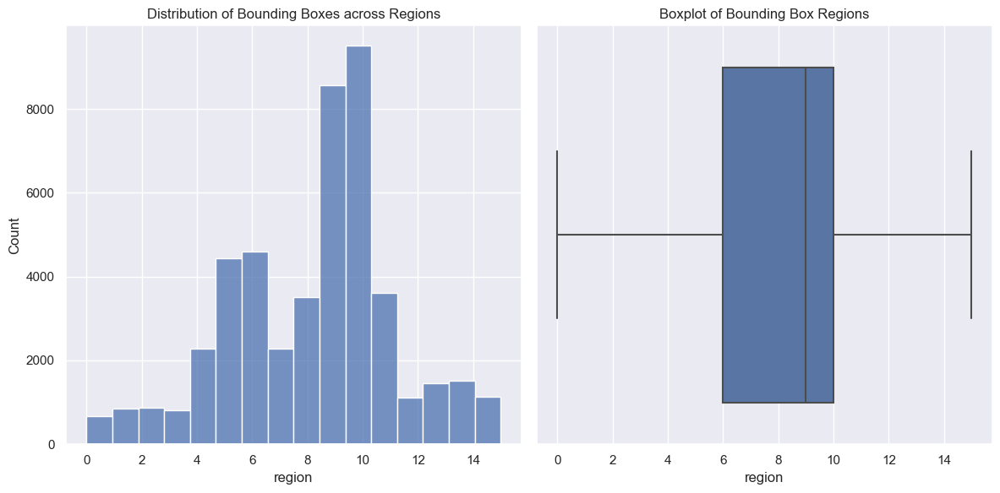

In [ ]:
sns.set(style="darkgrid")
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot a histrogram
sns.histplot(df_bbx_analysis['region'], bins=NUM_ROWS*NUM_COLS, kde=False, ax=axes[0])
axes[0].set_title('Distribution of Bounding Boxes across Regions')

# Plot a boxplot
sns.boxplot(x=df_bbx_analysis['region'], ax=axes[1])
axes[1].set_title('Boxplot of Bounding Box Regions')

plt.tight_layout()

plt.show()

In [ ]:
# List the objects in region 9
df_bbx_analysis[df_bbx_analysis['region'] == 9]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,...,is_multi_object,img_size,is_multi_class,bbx_width,bbx_height,bbx_size,bbx_aspect_ratio,bbx_central_x,bbx_central_y,region
6,horse,69.0,172.0,270.0,330.0,0,0,-1,000009.jpg,500,...,1,187500,1,201.0,158.0,31758.0,1.272152,169.5,251.0,9
7,person,150.0,141.0,229.0,284.0,0,0,-1,000009.jpg,500,...,1,187500,1,79.0,143.0,11297.0,0.552448,189.5,212.5,9
17,dog,1.0,235.0,182.0,388.0,1,0,-1,000021.jpg,336,...,1,168000,1,181.0,153.0,27693.0,1.183007,91.5,311.5,9
21,bicycle,9.0,230.0,245.0,500.0,1,0,-1,000023.jpg,334,...,1,167000,1,236.0,270.0,63720.0,0.874074,127.0,365.0,9
28,car,90.0,125.0,337.0,212.0,0,0,-1,000026.jpg,500,...,0,166500,0,247.0,87.0,21489.0,2.839080,213.5,168.5,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47193,train,1.0,140.0,349.0,314.0,0,0,0,2011_003260.jpg,500,...,1,187500,1,348.0,174.0,60552.0,2.000000,175.0,227.0,9
47202,bicycle,132.0,245.0,186.0,332.0,0,0,1,2011_003261.jpg,375,...,1,187500,1,54.0,87.0,4698.0,0.620690,159.0,288.5,9
47203,person,130.0,210.0,186.0,292.0,0,0,1,2011_003261.jpg,375,...,1,187500,1,56.0,82.0,4592.0,0.682927,158.0,251.0,9
47206,bottle,215.0,154.0,253.0,272.0,0,0,0,2011_003262.jpg,500,...,1,179500,1,38.0,118.0,4484.0,0.322034,234.0,213.0,9


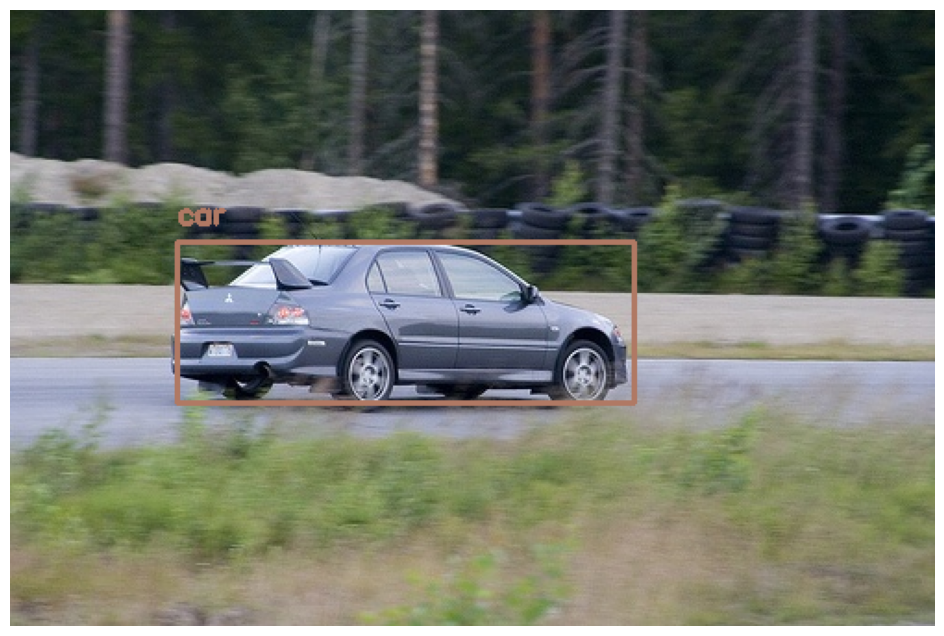

In [ ]:
# Show the image sample
vis_image(df_bbx_analysis,'000026.jpg')

#### 2.3.4 Small object detection

We define the small object as below:
- Median of relative areas (the ratio of the bounding box area over the image area) of all
the object stances in the same class is between 0.08% to 0.58%

- The ratio of the width and height of the target bounding box to the width and height of the image is less than 0.01

- The ratio of the square root of the target bounding box area to the square root of the image area is less than 0.03

- Bounding box is 32 ×32 pixels or less

If an object satisfies any of these criteria, it will be classified as a "small object", label "is_small_object" is added to the corresponding object.

> In the trainval dataset, there are 5,554 small objects in 2,224 images.

In [ ]:
# Set the Criteria 1
condition_relative_scale = (df_bbx_analysis['bbx_size'] / df_bbx_analysis['img_size'] * 100) < 0.58

# Set the Criteria 2
df_bbx_analysis['aspect_ratio'] = df_bbx_analysis['width'] / df_bbx_analysis['height']
condition_aspect_ratio = (df_bbx_analysis['bbx_aspect_ratio']/df_bbx_analysis['aspect_ratio'] < 0.1)

# Set the Criteria 3
df_bbx_analysis[['bbx_size', 'img_size']] = df_bbx_analysis[['bbx_size', 'img_size']].astype(float)
condition_sqrt_scale = (np.sqrt(df_bbx_analysis['bbx_size']) / np.sqrt(df_bbx_analysis['img_size'])) < 0.03

# Set the Criteria 4
condition_absolute_scale = (df_bbx_analysis['bbx_size'] < (32 * 32))

# Add the label "is_small_object" to the object that satisfies any of these four criteria.
df_bbx_analysis['is_small_object'] = np.where(condition_relative_scale |
                                          condition_absolute_scale |
                                          condition_aspect_ratio |
                                          condition_sqrt_scale, 1, 0)

df_bbx_analysis[df_bbx_analysis['is_small_object'] == 1][['filename','bbx_size','is_small_object']]

,filename,bbx_size,is_small_object
34,000032.jpg,882.0,1
35,000032.jpg,882.0,1
89,000066.jpg,817.0,1
122,000091.jpg,480.0,1
123,000091.jpg,840.0,1
...,...,...,...
47195,2011_003260.jpg,880.0,1
47196,2011_003260.jpg,690.0,1
47199,2011_003260.jpg,918.0,1
47200,2011_003260.jpg,540.0,1


In [ ]:
# Exploration of the sample image with small object
df_bbx_analysis[df_bbx_analysis['filename'] == '2011_003260.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,...,is_multi_class,bbx_width,bbx_height,bbx_size,bbx_aspect_ratio,bbx_central_x,bbx_central_y,region,aspect_ratio,is_small_object
47193,train,1.0,140.0,349.0,314.0,0,0,0,2011_003260.jpg,500,...,1,348.0,174.0,60552.0,2.000000,175.0,227.0,9,1.333333,0
47194,train,1.0,165.0,67.0,208.0,1,0,1,2011_003260.jpg,500,...,1,66.0,43.0,2838.0,1.534884,34.0,186.5,4,1.333333,0
47195,person,310.0,182.0,330.0,226.0,0,0,0,2011_003260.jpg,500,...,1,20.0,44.0,880.0,0.454545,320.0,204.0,10,1.333333,1
47196,person,328.0,182.0,343.0,228.0,0,0,0,2011_003260.jpg,500,...,1,15.0,46.0,690.0,0.326087,335.5,205.0,10,1.333333,1
47197,person,336.0,192.0,367.0,266.0,0,0,0,2011_003260.jpg,500,...,1,31.0,74.0,2294.0,0.418919,351.5,229.0,10,1.333333,0
47198,person,458.0,190.0,487.0,274.0,0,0,0,2011_003260.jpg,500,...,1,29.0,84.0,2436.0,0.345238,472.5,232.0,11,1.333333,0
47199,person,410.0,192.0,428.0,243.0,0,1,1,2011_003260.jpg,500,...,1,18.0,51.0,918.0,0.352941,419.0,217.5,11,1.333333,1
47200,person,14.0,182.0,29.0,218.0,0,1,0,2011_003260.jpg,500,...,1,15.0,36.0,540.0,0.416667,21.5,200.0,8,1.333333,1
47201,person,35.0,184.0,47.0,208.0,1,1,1,2011_003260.jpg,500,...,1,12.0,24.0,288.0,0.500000,41.0,196.0,8,1.333333,1


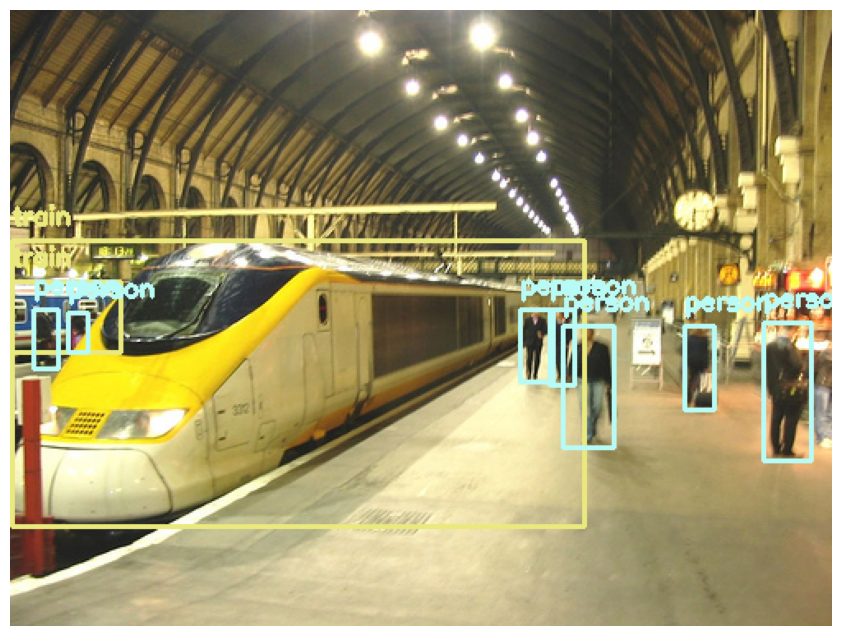

In [ ]:
# Show the sample image with small object
vis_image(df_bbx_analysis,'2011_003260.jpg')

In [ ]:
df_trainval['is_small_object'] = df_bbx_analysis['is_small_object']

In [ ]:
df_trainval

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0,0
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0,0
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,375,3,5,1,187500,0,0
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0,0
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,375,3,5,1,187500,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47218,car,19.0,347.0,309.0,461.0,0,0,0,2011_003269.jpg,334,500,3,1,0,167000,0,0
47219,bottle,98.0,1.0,499.0,405.0,1,0,0,2011_003271.jpg,500,500,3,1,0,250000,0,0
47220,train,1.0,113.0,384.0,215.0,1,0,0,2011_003274.jpg,500,375,3,1,0,187500,0,0
47221,aeroplane,42.0,50.0,448.0,282.0,0,0,0,2011_003275.jpg,500,403,3,1,0,201500,0,0


In [ ]:
df_trainval[df_trainval['is_small_object'] == 1]

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object
34,person,195.0,180.0,213.0,229.0,0,0,-1,000032.jpg,500,281,3,4,1,140500,1,1
35,person,26.0,189.0,44.0,238.0,0,0,-1,000032.jpg,500,281,3,4,1,140500,1,1
89,person,209.0,187.0,228.0,230.0,0,0,-1,000066.jpg,500,375,3,3,1,187500,0,1
122,car,81.0,248.0,105.0,268.0,1,0,-1,000091.jpg,500,375,3,3,1,187500,0,1
123,car,91.0,250.0,126.0,274.0,0,0,-1,000091.jpg,500,375,3,3,1,187500,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47195,person,310.0,182.0,330.0,226.0,0,0,0,2011_003260.jpg,500,375,3,9,1,187500,1,1
47196,person,328.0,182.0,343.0,228.0,0,0,0,2011_003260.jpg,500,375,3,9,1,187500,1,1
47199,person,410.0,192.0,428.0,243.0,0,1,1,2011_003260.jpg,500,375,3,9,1,187500,1,1
47200,person,14.0,182.0,29.0,218.0,0,1,0,2011_003260.jpg,500,375,3,9,1,187500,1,1


In [ ]:
small_a = len(df_trainval[df_trainval['is_small_object'] == 1])
small_b = len(df_trainval[df_trainval['is_small_object'] == 1].groupby('filename').sum())
print(f'In the trainval dataset, there are{small_a}small objects in{small_b}images')


df_trainval中包含的小目标共有5554条数据,分别在2224个图片中。


### **2.4 Image Quality Assessment (IQA)**
> This section is divided into full-reference (FR) and no-reference (NR) methods.
Reference: https://baike.baidu.com/item/IQA/19453034?fr=ge_ala

- For FR methods, labels such as PSNR, SSIM, and img_quality can be added as indicators of image quality.
- For NR methods, a label such as niqe_score can be added as an indicator of image quality.

Due to time constraint, only a simple method is used here to make preliminary judgments on image quality. For a more detailed and rigorous process, one can refer to various image quality assessment algorithms.
References：
> - http://www.cjig.cn/html/2022/5/20220505.htm
> - https://juejin.cn/post/6844904114837536781
> - https://developer.aliyun.com/article/717322
>
**notice that the FR method (section 2.4.1) is not feasible, we delect this part of code.**

In [ ]:
# df_img = df_trainval.groupby('filename').first().reset_index()
# df_img_test = df_test.groupby('filename').first().reset_index()

image_folder = "JPEGImages"

#### 2.4.2 No-Reference Method
> This section is based on the GitHub project Awesome Image Quality Assessment (IQA).
References:
> - https://github.com/chaofengc/Awesome-Image-Quality-Assessment
> - https://github.com/chaofengc/IQA-PyTorch

Main indicators involved (lower scores indicate higher quality):
- Perceptual Image Quality Evaluator (PIQE):
   It mainly detects image distortions and artifacts caused by image compression.
- Blind/No-Reference Image Spatial Quality Evaluator (BRISQUE):
   Based on support vector machine (SVM) learning the mapping relationship between image quality and image features, it focuses on statistical properties of natural images, especially spatial domain characteristics.
  It has been widely used in various image processing and analysis tasks, proving its effectiveness. Nevertheless, it requires a certain training dataset (annotated data).

- Natural Image Quality Evaluator (NIQE):
   It is also based on statistical properties of natural scenes, but unlike BRISQUE, NIQE does not require a training process, so it might be slightly faster. It is widely applicable to various types of image quality evaluation.

Considering the above points, NIQE is chosen as the indicator. For details on the indicators, refer to: https://blog.csdn.net/Doctor__Chen/article/details/135967840



In [ ]:
# Example: calculating the NIQE score of an image
start_time = time.time()

niqe_metric = pyiqa.create_metric('niqe')

image_path = os.path.join(image_folder, '2011_003271.jpg')
# score = calculate_niqe(image_path)
score = niqe_metric(image_path)

end_time = time.time()
execution_time = end_time - start_time
print("Execution time:", execution_time, "seconds")
# Execution time: 0.10288596153259277 seconds
# Calculation time: 0.1s / image
# The total calculation time for 16,551 images is approximately 27 minutes
print(f'NIQE score for the image: {score}')
# type(float(score))

Execution time: 0.2005293369293213 seconds
NIQE score for the image: 3.532119003424121


In [ ]:
df_img_NR = df_trainval.groupby('filename').first().reset_index()

niqe_metric = pyiqa.create_metric('niqe')

for index, row in df_img_NR.iterrows():
    filename = row['filename']
    # print(f'assessing file {filename}')
    image_path = os.path.join(image_folder, filename)
    try:
        niqe_score = niqe_metric(image_path)
        df_img_NR.at[index, 'niqe_score'] = float(niqe_score)
    except Exception as e:
        print(f"Error processing image {filename}: {e}")
        df_img_NR.at[index, 'niqe_score'] = None

df_img_NR

Error processing image 2008_001823.jpg: Expected 3D or 4D (batch mode) tensor with possibly 0 batch size and other non-zero dimensions for input, but got: [1, 1, 0, 480]
Error processing image 2008_003374.jpg: Expected 3D or 4D (batch mode) tensor with possibly 0 batch size and other non-zero dimensions for input, but got: [1, 1, 0, 384]


,filename,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object,niqe_score
0,000005.jpg,chair,263.0,211.0,324.0,339.0,0,0,-1,500,375,3,5,1,187500,0,0,3.480605
1,000007.jpg,car,141.0,50.0,500.0,330.0,1,0,-1,500,333,3,1,0,166500,0,0,5.198441
2,000009.jpg,horse,69.0,172.0,270.0,330.0,0,0,-1,500,375,3,4,1,187500,1,0,4.077257
3,000012.jpg,car,156.0,97.0,351.0,270.0,0,0,-1,500,333,3,1,0,166500,0,0,5.526709
4,000016.jpg,bicycle,92.0,72.0,305.0,473.0,0,0,-1,334,500,3,1,0,167000,0,0,3.866582
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16546,2011_003269.jpg,car,19.0,347.0,309.0,461.0,0,0,0,334,500,3,1,0,167000,0,0,4.270942
16547,2011_003271.jpg,bottle,98.0,1.0,499.0,405.0,1,0,0,500,500,3,1,0,250000,0,0,3.532119
16548,2011_003274.jpg,train,1.0,113.0,384.0,215.0,1,0,0,500,375,3,1,0,187500,0,0,6.472539
16549,2011_003275.jpg,aeroplane,42.0,50.0,448.0,282.0,0,0,0,500,403,3,1,0,201500,0,0,5.461520


In [ ]:
df_trainval = df_trainval.merge(df_img_NR[['filename', 'niqe_score']], on='filename', how='left')
df_trainval

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object,niqe_score
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0,0,3.480605
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0,0,3.480605
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,375,3,5,1,187500,0,0,3.480605
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,375,3,5,1,187500,0,0,3.480605
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,375,3,5,1,187500,0,0,3.480605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47218,car,19.0,347.0,309.0,461.0,0,0,0,2011_003269.jpg,334,500,3,1,0,167000,0,0,4.270942
47219,bottle,98.0,1.0,499.0,405.0,1,0,0,2011_003271.jpg,500,500,3,1,0,250000,0,0,3.532119
47220,train,1.0,113.0,384.0,215.0,1,0,0,2011_003274.jpg,500,375,3,1,0,187500,0,0,6.472539
47221,aeroplane,42.0,50.0,448.0,282.0,0,0,0,2011_003275.jpg,500,403,3,1,0,201500,0,0,5.461520


In [ ]:
# Anomaly detection
# 2008_001823
df_trainval[df_trainval['filename'] == '2008_001823.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object,niqe_score
18170,boat,37.0,44.0,103.0,70.0,0,0,0,2008_001823.jpg,500,71,3,1,0,35500,0,0,NaN


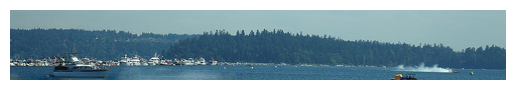

In [ ]:
img_show('2008_001823.jpg')

In [ ]:
# 2008_003374.jpg
df_trainval[df_trainval['filename'] == '2008_003374.jpg']

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object,niqe_score
20422,dog,7.0,23.0,103.0,84.0,0,0,0,2008_003374.jpg,400,88,3,2,1,35200,0,0,NaN
20423,dog,363.0,3.0,379.0,34.0,0,0,0,2008_003374.jpg,400,88,3,2,1,35200,0,1,NaN


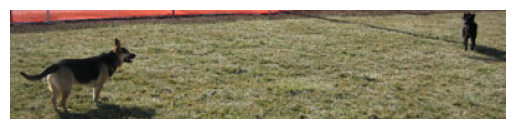

In [ ]:
img_show('2008_003374.jpg')

### 2.5 Data filtering
Considering the dataset size and model efficiency, it is necessary to select representative data and split it into training/validation set and test set.

A basic implementation approach is demonstrated as follows:
-	Select representative data based on feature engineering and data distribution.
-	List the filenames of these selected data to obtain a list.
-	Split the list into trainval and test sets.

Specific steps:
-	Choose the top 100 images with the lowest niqe_score from each class that are also easily recognizable (i.e., a total of 2000 images, 6846 bounding boxes).
Note: Lower niqe scores indicate better quality.

-	If necessary, filter based on features (such as whether multi-object recognition is involved, or the proportion of small-object detection in the dataset). This requires further data analysis on the filtered dataset.

If no data augmentation is planned, data can be filtered by sorting it according to the niqe_score.


#### 2.5.1 Filtering using niqe_score

In [ ]:
# df_selected = df_trainval[['filename','class','truncated','difficult',
#                            'occluded','bbx_num','is_multi_object','img_size',
#                            'is_multi_class','is_small_object','niqe_score']].copy()
df_selected = df_trainval.copy()
df_select = df_trainval.groupby('filename').first().reset_index()
print(f"df_select niqe_score mean: {df_select.niqe_score.mean()}")
df_select.groupby('class')['niqe_score'].describe()

df_select niqe_score mean: 4.469167256991013


,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
aeroplane,881.0,6.144326,2.334065,2.362307,4.494856,5.540908,7.275854,26.032303
bicycle,620.0,4.325788,1.233667,1.991599,3.436151,4.110565,5.016420,9.140577
bird,1049.0,5.067324,1.911351,1.984175,3.814966,4.690573,5.840459,18.728685
boat,594.0,4.801670,1.472103,2.052304,3.807085,4.566222,5.377758,15.143206
bottle,509.0,4.317860,1.498597,2.138981,3.401859,3.943055,4.734323,12.233410
bus,537.0,4.117833,0.969203,2.049034,3.468268,3.961979,4.546067,10.321501
car,1317.0,4.353119,1.183808,1.451581,3.608053,4.216016,4.903872,17.510006
cat,1320.0,4.523504,1.303584,2.015057,3.592232,4.335085,5.206768,14.453226
chair,766.0,4.421648,1.406802,2.119426,3.556148,4.147908,4.909875,16.013075


In [ ]:
# Select 100 images with the lowest NIQE score in each class
top_n = 100
selected_samples = []

for class_name, group in df_select[df_select.difficult == 0].groupby('class'):
    sorted_group = group.sort_values(by='niqe_score')
    top_group = sorted_group.head(top_n)
    selected_samples.append(top_group)

df_select = pd.concat(selected_samples)

print(f"Selected samples niqe_score mean: {df_select.niqe_score.mean()}")
df_select


Selected samples niqe_score mean: 2.875323287000366


,filename,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object,niqe_score
15626,2011_001158.jpg,aeroplane,1.0,281.0,94.0,348.0,1,0,0,375,500,3,5,1,187500,1,0,2.362307
3342,006636.jpg,aeroplane,26.0,75.0,355.0,238.0,0,0,-1,500,375,3,1,0,187500,0,0,2.413551
15786,2011_001541.jpg,aeroplane,23.0,105.0,202.0,174.0,0,0,1,500,289,3,2,1,144500,0,0,2.458006
1048,002129.jpg,aeroplane,106.0,50.0,256.0,122.0,0,0,-1,500,379,3,4,1,189500,0,0,2.578190
4285,008522.jpg,aeroplane,198.0,144.0,335.0,188.0,0,0,-1,500,333,3,1,0,166500,0,0,2.608945
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10212,2009_001682.jpg,tvmonitor,165.0,126.0,352.0,250.0,0,0,0,500,375,3,1,0,187500,0,0,3.528885
4219,008386.jpg,tvmonitor,154.0,56.0,256.0,162.0,0,0,-1,500,375,3,3,1,187500,1,0,3.535433
12223,2010_000318.jpg,tvmonitor,336.0,64.0,500.0,249.0,0,0,0,500,375,3,2,1,187500,0,0,3.548386
7151,2008_004333.jpg,tvmonitor,310.0,103.0,500.0,285.0,0,0,0,500,375,3,4,1,187500,1,0,3.549823


In [ ]:
df_select.groupby('class')['niqe_score'].describe()

,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
aeroplane,100.0,3.476679,0.419041,2.362307,3.225497,3.582417,3.811706,3.970016
bicycle,100.0,2.796637,0.269190,1.991599,2.636808,2.848274,3.023098,3.157034
bird,100.0,2.803178,0.258935,1.984175,2.672726,2.854179,3.014541,3.121875
boat,100.0,3.128309,0.371881,2.052304,2.936821,3.263137,3.408721,3.550961
bottle,100.0,2.904778,0.326542,2.138981,2.690106,3.029700,3.160402,3.313936
bus,100.0,3.047712,0.266883,2.164569,2.979136,3.119026,3.251358,3.325835
car,100.0,2.681402,0.288589,1.451581,2.523769,2.781162,2.898714,3.007677
cat,100.0,2.736874,0.205236,2.015057,2.616068,2.782984,2.911147,2.983140
chair,100.0,2.948178,0.271266,2.119426,2.829630,3.004520,3.140112,3.256774


In [ ]:
# Filter df_selected according to df_selected[‘Filename’]
df_selected = df_selected[df_selected['filename'].isin(df_select['filename'])]
df_selected.reset_index(drop=True, inplace=True)
df_selected

,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,height,depth,bbx_num,is_multi_object,img_size,is_multi_class,is_small_object,niqe_score
0,person,185.0,62.0,279.0,199.0,0,0,-1,000017.jpg,480,364,3,2,1,174720,1,0,2.453305
1,horse,90.0,78.0,403.0,336.0,0,0,-1,000017.jpg,480,364,3,2,1,174720,1,0,2.453305
2,train,116.0,167.0,360.0,400.0,1,0,-1,000034.jpg,360,500,3,2,1,180000,0,0,2.135464
3,train,141.0,153.0,333.0,229.0,1,0,-1,000034.jpg,360,500,3,2,1,180000,0,0,2.135464
4,bird,211.0,234.0,317.0,366.0,0,0,-1,000046.jpg,332,500,3,1,0,166000,0,0,2.734462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6841,person,336.0,192.0,367.0,266.0,0,0,0,2011_003260.jpg,500,375,3,9,1,187500,1,0,2.870318
6842,person,458.0,190.0,487.0,274.0,0,0,0,2011_003260.jpg,500,375,3,9,1,187500,1,0,2.870318
6843,person,410.0,192.0,428.0,243.0,0,1,1,2011_003260.jpg,500,375,3,9,1,187500,1,1,2.870318
6844,person,14.0,182.0,29.0,218.0,0,1,0,2011_003260.jpg,500,375,3,9,1,187500,1,1,2.870318


In [ ]:
# Convert to csv format
df_trainval.to_csv('df_trainval.csv',encoding = 'utf-8')
df_test.to_csv('df_test.csv',encoding = 'utf-8')
df_selected.to_csv('df_selected.csv',encoding = 'utf-8')

## **3. Data Preprocessing**
- Size standardization: standardize the height and width of images
- Bounding box normalization: normalize the height and width of bounding boxes to accelerate convergence of model training
- Data augmentation
Data exclusion can be performed if problems are still present in the filtered data (For example, if data is imbalance, certain rules can be applied for data exclusion).


In [ ]:
df_trainval_processing = df_trainval.copy()
df_test_processing = df_test.copy()

### 3.1 Size standardization

In [ ]:
# # The target size can be adjusted as needed

# def resize_images(df, image_folder_path, target_size=(224, 224)):
#     output_folder = 'JPEGImages_processing'  # The folder path for saving new images
#     os.makedirs(output_folder, exist_ok=True)  # Create the output folder
#     for index, row in df.iterrows():
#         image_path = os.path.join(image_folder_path, row['filename'])
#         image = cv2.imread(image_path)
#         resized_image = cv2.resize(image, target_size)
#         df.at[index, 'width'] = target_size[0]
#         df.at[index, 'height'] = target_size[1]
#         # Save the adjusted images
#         output_image_path = os.path.join(output_folder, row['filename'])
#         cv2.imwrite(output_image_path, resized_image)

# # Call the function, with 'image_folder_path' being the folder path where your images are stored
# resize_images(df_trainval, 'JPEGImages', target_size=(224, 224))

# # The conversion is complete and the adjusted images are saved in the 'JPEGImages_processing' folder.
# # Uncomment the code block if conversion is needed again.

### 3.2 Bounding box normalization
Normalizing bounding boxes is a crucial step in object detection as it can effectively enhance the model's generalization ability and detection accuracy. It is also a requirement for YOLO data format.
-	The absolute coordinates are converted to relative values based on the pixel values of the feature map (labels: bbx_center_x, bbx_center_y).
-	The logarithm of the aspect ratio is taken to minimize the impact of scale changes on the model (labels: log_bbx_width, log_bbx_height).



In [ ]:
def normalize_bbox(df):
    # Calculate the height and width of the bounding box
    df['bbx_width'] = df['xmax'] - df['xmin']
    df['bbx_height'] = df['ymax'] - df['ymin']

    # Calculate the coordinates of the centre of bounding box
    df['bbx_center_x'] = df['xmin'] + 0.5 * df['bbx_width']
    df['bbx_center_y'] = df['ymin'] + 0.5 * df['bbx_height']

    # Compute the relative values of the bounding box
    df['bbx_center_x'] /= df['width']
    df['bbx_center_y'] /= df['height']
    df['bbx_width'] /= df['width']
    df['bbx_height'] /= df['height']

    # Convert the dataframe columns to NumPy arrays and take the logarithm.
    df['log_bbx_width'] = np.log(df['bbx_width'].astype(float))
    df['log_bbx_height'] = np.log(df['bbx_height'].astype(float))

    return df

df_selected = normalize_bbox(df_selected)
df_selected


,class,xmin,ymin,xmax,ymax,truncated,difficult,occluded,filename,width,...,img_size,is_multi_class,is_small_object,niqe_score,bbx_width,bbx_height,bbx_center_x,bbx_center_y,log_bbx_width,log_bbx_height
0,chair,263.0,211.0,324.0,339.0,0,0,-1,000005.jpg,500,...,187500,0,0,3.480605,0.122,0.341333,0.587,0.733333,-2.103734,-1.074896
1,chair,165.0,264.0,253.0,372.0,0,0,-1,000005.jpg,500,...,187500,0,0,3.480605,0.176,0.288,0.418,0.848,-1.737271,-1.244795
2,chair,5.0,244.0,67.0,374.0,1,1,-1,000005.jpg,500,...,187500,0,0,3.480605,0.124,0.346667,0.072,0.824,-2.087474,-1.059392
3,chair,241.0,194.0,295.0,299.0,0,0,-1,000005.jpg,500,...,187500,0,0,3.480605,0.108,0.28,0.536,0.657333,-2.225624,-1.272966
4,chair,277.0,186.0,312.0,220.0,1,1,-1,000005.jpg,500,...,187500,0,0,3.480605,0.07,0.090667,0.589,0.541333,-2.659260,-2.400566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47218,car,19.0,347.0,309.0,461.0,0,0,0,2011_003269.jpg,334,...,167000,0,0,4.270942,0.868263,0.228,0.491018,0.808,-0.141260,-1.478410
47219,bottle,98.0,1.0,499.0,405.0,1,0,0,2011_003271.jpg,500,...,250000,0,0,3.532119,0.802,0.808,0.597,0.406,-0.220647,-0.213193
47220,train,1.0,113.0,384.0,215.0,1,0,0,2011_003274.jpg,500,...,187500,0,0,6.472539,0.766,0.272,0.385,0.437333,-0.266573,-1.301953
47221,aeroplane,42.0,50.0,448.0,282.0,0,0,0,2011_003275.jpg,500,...,201500,0,0,5.461520,0.812,0.575682,0.49,0.411911,-0.208255,-0.552199


### 3.3 Data augmentation
Apply a series of data augmentation techniques, including common methods such as rotation, scaling, translation, flipping, and color transformation, as well as the method mentioned in 2.2.3.

Basic Steps:
1. Random Cropping: Randomly crop a part of the image, which helps the model learn features of different parts of the object. Different cropping sizes and positions could be applied.
2. Horizontal Flipping: Randomly flip the image horizontally to augment the dataset. Note that horizontal flipping may not be suitable for some object categories (such as text).
3. Rotation: Randomly rotate the image by a certain angle to enable the model to learn object features from different angles.
4. Scaling: Randomly scale the size of the image to simulate object sizes at different distances.
5. Brightness/Contrast Adjustment: Adjust the brightness and contrast of the image to make the model robust to different lighting conditions.
6. Adding Noise: Add random noise to the image to simulate changes in real-world images.
7. Color Transformation: Transform the color channels of the image, such as changing saturation and hue, to increase the diversity of the data.
8. Composition of Augmentations: Combine multiple data augmentation techniques to achieve greater effects.

Reference: https://blog.csdn.net/jcfszxc/article/details/135419911
https://github.com/Paperspace/DataAugmentationForObjectDetection
https://github.com/ZhenglinZhou/Data_Augmentation_Zoo_for_Object_Detection


## 4. Data Export
After data preprocessing, the columns needed from df_trainval can be filtered and converted to txt format or the data format required by the model.

YOLO Format Data Introduction: https://blog.csdn.net/u011775793/article/details/134918087

There are also YOLO format conversion tools available on GitHub.
